# Code overview for Vision Transformers Need Registers reproduction 

# LOST
Original files can be found in the /LOST/ directory

### LOST scores on DeiT-III

In [ ]:
!pip install -r './LOST/LOST_DeiT3/requirements.txt'

In [ ]:
import sys
from LOST.LOST_DeiT3.custom_datasets import VOC2007Dataset
import torchvision

In [ ]:
dataset = torchvision.datasets.VOCDetection(
    root="./LOST/LOST_DeiT3/datasets/VOC2007",
    year="2007",
    image_set="trainval",
    download=True
)
print(f"Number of images in the trainval set: {len(dataset)}")

In [ ]:
!python LOST/LOST_DeiT3/main_lost.py \
    --voc_root "./LOST/LOST_DeiT3/datasets/VOC2007" \
    --voc_set trainval \
    --checkpoint_path "/checkpoints/source_checkpoints/checkpoint299.pth" \
    --model_type source

In [ ]:
!python LOST/LOST_DeiT3/main_lost.py \
    --voc_root "./LOST/LOST_DeiT3/datasets/VOC2007" \
    --voc_set trainval \
    --checkpoint_path "/checkpoints/reg_checkpoints/checkpoint299.pth" \
    --model_type reg

### LOST scores on DINOv2

In [ ]:
!pip install -r './LOST/LOST_DINOv2/requirements.txt'

In [ ]:
import sys
from LOST.LOST_DINOv2.custom_datasets import VOC2007Dataset
import torchvision

In [ ]:
dataset = torchvision.datasets.VOCDetection(
    root="./LOST/LOST_DINOv2/datasets/VOC2007",
    year="2007",
    image_set="trainval",
    download=True
)
print(f"Number of images in the trainval set: {len(dataset)}")

In [ ]:
# 1) Download the pretrained checkpoints for ViT-L/14 (with and without registers)
!wget https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth
!wget https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_reg4_pretrain.pth

# 2) Move the downloaded files into dinov2/models/
!mv "dinov2_vitl14_pretrain.pth" "./LOST/LOST_DINOv2/dinov2/models/dinov2_vitl14_pretrain.pth"
!mv "dinov2_vitl14_reg4_pretrain.pth" "./LOST/LOST_DINOv2/dinov2/models/dinov2_vitl14_reg4_pretrain.pth"

# 3) Check files are in place
!ls -l "./LOST/LOST_DINOv2/dinov2/models"


In [ ]:
# Run LOST on DINOv2 Without Registers
!python LOST/LOST_DINOv2/main_lost.py \
    --arch dinov2_vitl14 \
    --dataset VOC07 \
    --set trainval \
    --which_features k \
    --output_dir "./LOST/LOST_DINOv2/outputs_dino_without_registers"

In [ ]:
# Run LOST on DINOv2 With Registers
!python LOST/LOST_DINOv2/main_lost.py \
    --arch dinov2_vitl14_reg \
    --dataset VOC07 \
    --set trainval \
    --which_features k \
    --output_dir "./LOST/LOST_DINOv2/outputs_dino_with_registers"

# Attention maps
Original files can be found in the /attn_maps/ directory

### att_maps.ipynb
CLS token attention maps for DeiT-III and DINOv2 with and without registers

In [ ]:
import torch
import torch.nn as nn
from functools import partial

from timm.models import create_model
import torch.nn.functional as F
from torchvision.transforms import Compose, Resize, CenterCrop, Normalize, ToTensor
from deit.models_v2 import deit_small_patch16_LS, deit_base_patch16_LS
from deit_reg import models_v2

from PIL import Image
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import math

import os

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str) -> list[list[str]]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.

  Returns:
    A nested list of all image paths in the subfolders.
  """

  files : list[list[str]] = []
  
  paths = os.listdir(folder_path)
  if ".DS_Store" in paths:
    paths.remove(".DS_Store")
  # Iterate through the subfolders in the given folder
  for subfolder in paths:
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    files.append(folder)

  return files
     

In [ ]:
# To experiment on different images
folder_path = 'datasets/imagenette2/val'
image_paths = get_paths_in_subfolders(folder_path)
sample_images = []
for path in image_paths:
    for i in range(10):
        sample_images += [Image.open(path[i]).convert("RGB")]
        
selection = [2, 53, 19]
imgs = list(map(lambda i: sample_images[i], selection))

In [ ]:
# To replicate direct results with images in paper
chosen_imgs = []
for path in os.listdir("data/chosen_images"):
    if path != ".DS_Store":
        chosen_imgs += [Image.open(f'data/chosen_images/{path}').convert("RGB")]

In [ ]:
#code from https://github.com/huggingface/pytorch-image-models/discussions/1232+
def to_tensor(img):
    transform_fn = Compose([Resize(249, 3), CenterCrop(224), ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    return transform_fn(img)

def my_forward_wrapper(attn_obj):
    def my_forward(x):
        B, N, C = x.shape
        qkv = attn_obj.qkv(x).reshape(B, N, 3, attn_obj.num_heads, C // attn_obj.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv.unbind(0)   # make torchscript happy (cannot use tensor as tuple)

        attn = (q @ k.transpose(-2, -1)) * attn_obj.scale
        attn = attn.softmax(dim=-1)
        attn = attn_obj.attn_drop(attn)
        attn_obj.attn_map = attn
        attn_obj.cls_attn_map = attn[:, :, 0, 1:]

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = attn_obj.proj(x)
        x = attn_obj.proj_drop(x)
        return x
    return my_forward

#### DeiT

/var/folders/f5/0wsbjcm56b5czjl3m5v9l1tm0000gn/T/ipykernel_23548/3862158428.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f'{os.getcwd()}/sour

799


/var/folders/f5/0wsbjcm56b5czjl3m5v9l1tm0000gn/T/ipykernel_23548/3862158428.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint_reg = torch.load(f'{os.getcwd()}/

epoch 799


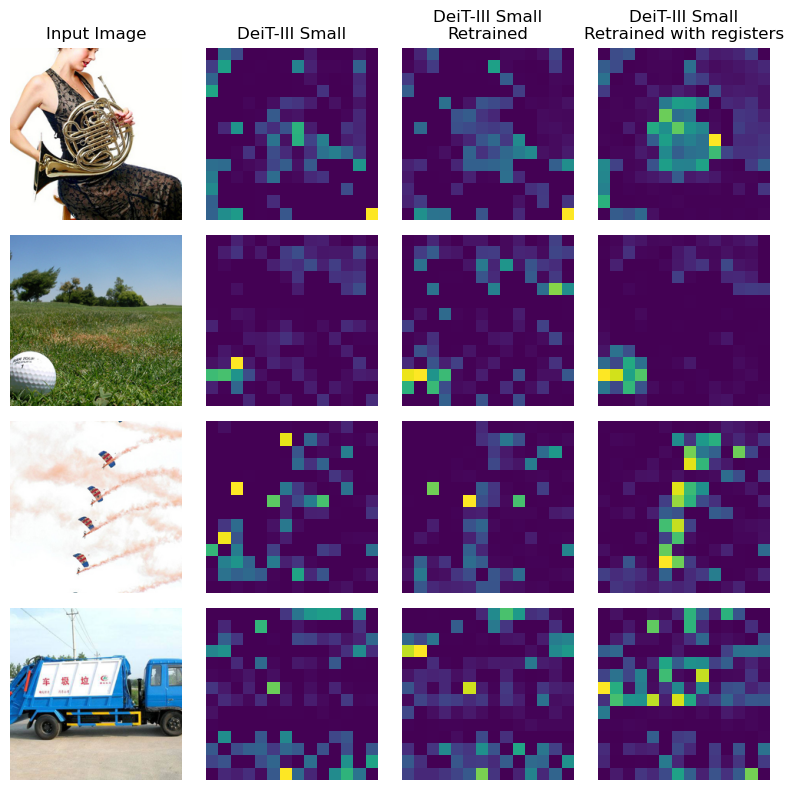

In [ ]:
bad = [6, 10, 25]
imgs_adj = list(map(lambda i: sample_images[i], bad))

# Load retrained model
pths = os.listdir('checkpoints/source_checkpoints')
pths.remove("log.txt")
pths.sort()

checkpoint = torch.load(f'{os.getcwd()}/checkpoints/source_checkpoints/checkpoint799.pth', map_location=torch.device('cpu'))
model_retrained = deit_small_patch16_LS()
model_retrained.load_state_dict(checkpoint["model"])
print('epoch', checkpoint['epoch'])

# Load retrained model with registerers
pths = os.listdir('checkpoints/reg_checkpoints')
pths.remove("log.txt")
pths.sort()

checkpoint_reg = torch.load(f'checkpoints/reg_checkpoints/checkpoint799.pth', map_location=torch.device('cpu'))
print('epoch', checkpoint_reg['epoch'])
    
model_reg = models_v2.vit_models(
    img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2.Layer_scale_init_Block)
model_reg.default_cfg = models_v2._cfg()
model_reg.load_state_dict(checkpoint_reg["model"])

models = [model_retrained, model_reg]
names = ["DeiT-III Small", "DeiT-III Small\nwith registers"]
# Set up plot
output_format = ((len(models)+1)*2, len(imgs)*2)
fig, ax = plt.subplots(len(imgs), len(models)+1, figsize=output_format)

for n_image, image in enumerate(imgs):
        
        x = to_tensor(image)

        # Display the original image
        img_resized = x.permute(1, 2, 0) * 0.5 + 0.5
        ax[n_image, 0].imshow(np.array(img_resized))
        ax[n_image, 0].axis('off')

        # Display the attention maps for the CLS token in the last layer for each model
        for n, model in enumerate(models):
            block = model.blocks[-1]
            block.attn.forward = my_forward_wrapper(block.attn)

            y = model(x.unsqueeze(0))

            # Pretrained model has no registers. 
            # Models without registers have 197 attention maps, models with registerss have 197 + num_regs attention maps
            if not hasattr(model, "num_regs") or model.num_regs == 0:
                cls_weight =  block.attn.cls_attn_map.mean(dim=1).detach().view(14, 14)      
            else:
                cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, 4:].detach().view(14, 14)
                
            
            ax[n_image, n+1].imshow(cls_weight)
            ax[n_image, n+1].axis('off')
        #ax[n_image, 0].set_title(bad[n_image])

# Set titles only to first row
ax[0, 0].set_title('Input Image').set_rotation(0)

for n, name in enumerate(names):
    ax[0, n+1].set_title(name)

plt.tight_layout()
plt.show()

#### DINOv2 Giant

In [ ]:
dinov2_giant = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14_reg')

In [ ]:
dinov2_giant_no_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14')

5 5


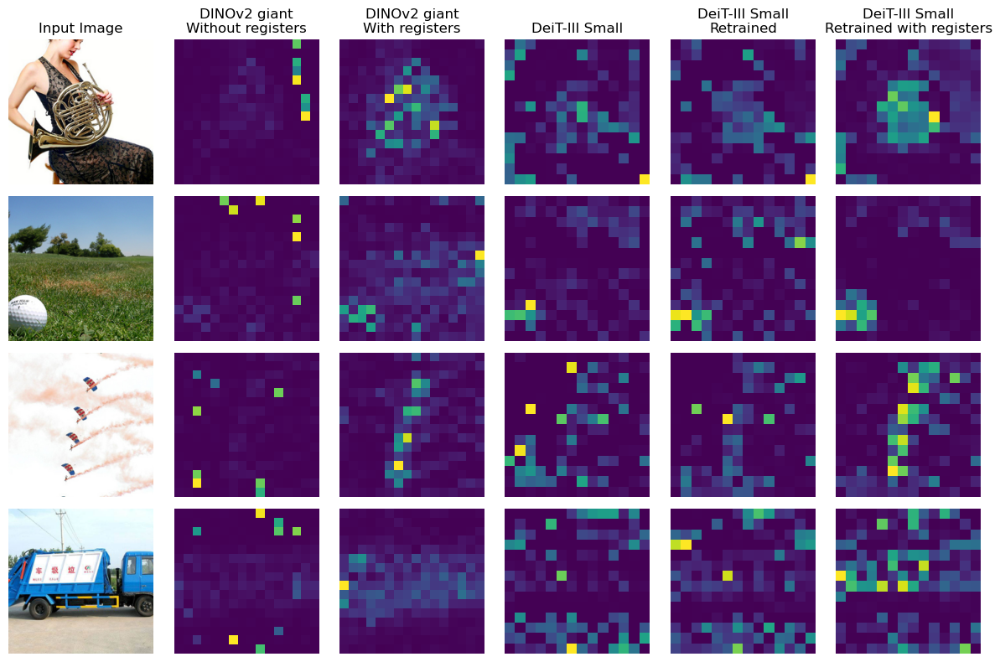

In [ ]:
models = [dinov2_giant_no_reg, dinov2_giant] + models
names = ["DINOv2 giant\nwithout registers", 'DINOv2 giant\nwith registers'] + names
output_format = ((len(models)+1)*2, len(imgs)*2)
fig, ax = plt.subplots(len(imgs), len(models)+1, figsize=output_format)


for n, model in enumerate(models):
    for n_image, image in enumerate(imgs):
            
            x = to_tensor(image)

            # Display the original image
            img_resized = x.permute(1, 2, 0) * 0.5 + 0.5
            ax[n_image, 0].imshow(np.array(img_resized))
            ax[n_image, 0].axis('off')

            # Display the attention maps for the CLS token in the last layer for each model
            block = model.blocks[-1]
            block.attn.forward = my_forward_wrapper(block.attn)

            y = model(x.unsqueeze(0))

            # Pretrained model has no registers. 
            # Models without registers have 197 attention maps, models with registerss have 197 + num_regs attention maps
            if hasattr(model, "num_register_tokens"):
                cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, model.num_register_tokens:].detach().view(16, 16)
            elif hasattr(model, "num_regs"):
                cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, model.num_regs:].detach().view(14, 14)
            else:
                cls_weight =  block.attn.cls_attn_map.mean(dim=1).detach().view(14, 14)  
            
            ax[n_image, n+1].imshow(cls_weight)
            ax[n_image, n+1].axis('off')
            #ax[n_image, 0].set_title(bad[n_image])

# Set titles only to first row
ax[0, 0].set_title('Input Image').set_rotation(0)

for n, name in enumerate(names):
    ax[0, n+1].set_title(name)

plt.tight_layout()
plt.show()

/var/folders/f5/0wsbjcm56b5czjl3m5v9l1tm0000gn/T/ipykernel_23548/3862158428.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f'{os.getcwd()}/sour

799


/var/folders/f5/0wsbjcm56b5czjl3m5v9l1tm0000gn/T/ipykernel_23548/3862158428.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint_reg = torch.load(f'{os.getcwd()}/

epoch 799


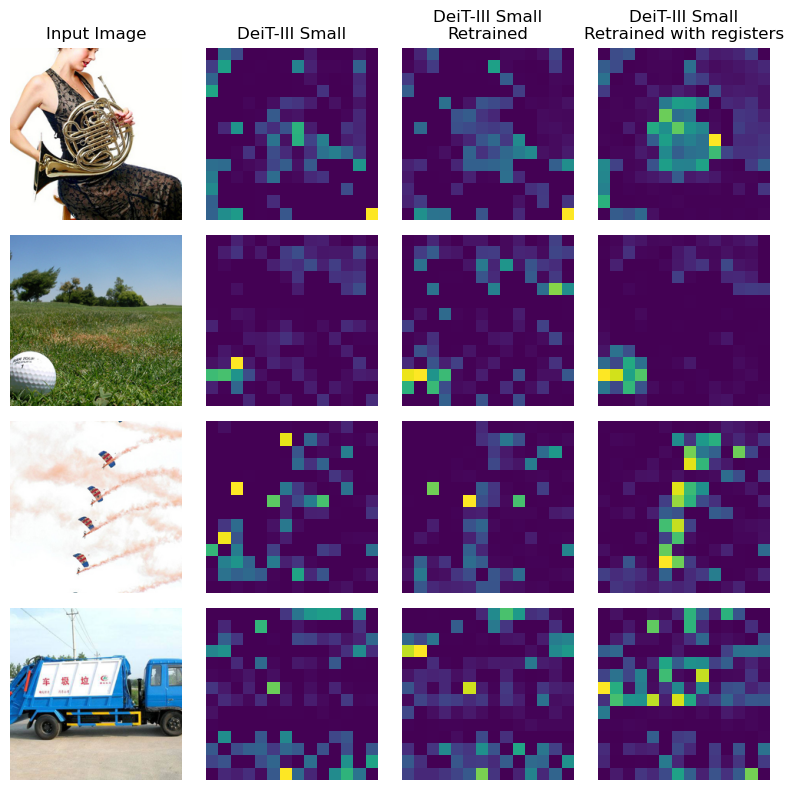

In [ ]:
bad = [6, 10, 25]
imgs_adj = list(map(lambda i: sample_images[i], bad))
# Load pretrained model
model_small = create_model('deit_small_patch16_LS', pretrained=True)

# Load retrained model
pths = os.listdir('checkpoints/source_checkpoints')
pths.remove("log.txt")
pths.sort()

checkpoint = torch.load(f'checkpoints/source_checkpoints/checkpoint.pth', map_location=torch.device('cpu'))
model_retrained = deit_small_patch16_LS()
model_retrained.load_state_dict(checkpoint["model"])
print(checkpoint['epoch'])

# Load retrained model with registerers
pths = os.listdir('checkpoints/reg_checkpoints')
pths.remove("log.txt")
pths.sort()

checkpoint_reg = torch.load(f'checkpoints/reg_checkpoints/checkpoint.pth', map_location=torch.device('cpu'))
print('epoch', checkpoint_reg['epoch'])
    
model_reg = models_v2.vit_models(
    img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2.Layer_scale_init_Block)
model_reg.default_cfg = models_v2._cfg()
model_reg.load_state_dict(checkpoint_reg["model"])

models = [model_small, model_retrained, model_reg]
names = ["DeiT-III Small", "DeiT-III Small\nRetrained", "DeiT-III Small\nRetrained with registers"]
# Set up plot
output_format = ((len(models)+1)*2, len(imgs)*2)
fig, ax = plt.subplots(len(imgs), len(models)+1, figsize=output_format)

for n_image, image in enumerate(imgs):
        
        x = to_tensor(image)

        # Display the original image
        img_resized = x.permute(1, 2, 0) * 0.5 + 0.5
        ax[n_image, 0].imshow(np.array(img_resized))
        ax[n_image, 0].axis('off')

        # Display the attention maps for the CLS token in the last layer for each model
        for n, model in enumerate(models):
            block = model.blocks[-1]
            block.attn.forward = my_forward_wrapper(block.attn)

            y = model(x.unsqueeze(0))

            # Pretrained model has no registers. 
            # Models without registers have 197 attention maps, models with registerss have 197 + num_regs attention maps
            if not hasattr(model, "num_regs") or model.num_regs == 0:
                cls_weight =  block.attn.cls_attn_map.mean(dim=1).detach().view(14, 14)      
            else:
                cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, 4:].detach().view(14, 14)
                
            
            ax[n_image, n+1].imshow(cls_weight)
            ax[n_image, n+1].axis('off')
        #ax[n_image, 0].set_title(bad[n_image])

# Set titles only to first row
ax[0, 0].set_title('Input Image').set_rotation(0)

for n, name in enumerate(names):
    ax[0, n+1].set_title(name)

plt.tight_layout()
plt.show()

### DeiT_reg_att_maps.ipynb
CLS and register tokens for last layer

In [ ]:
import torch
import torch.nn as nn
from functools import partial

from timm.models import create_model
import torch.nn.functional as F
from torchvision.transforms import Compose, Resize, CenterCrop, Normalize, ToTensor
from deit_reg.models_v2 import deit_small_patch16_LS as deit_regs
import deit_reg
from deit_reg import models_v2

from PIL import Image
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import math

import os

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str) -> list[list[str]]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.

  Returns:
    A nested list of all image paths in the subfolders.
  """

  files : list[list[str]] = []
  
  paths = os.listdir(folder_path)
  if ".DS_Store" in paths:
    paths.remove(".DS_Store")
  # Iterate through the subfolders in the given folder
  for subfolder in paths:
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    files.append(folder)

  return files
     

In [ ]:
# To experiment on different images
folder_path = 'imagenette2/val'
image_paths = get_paths_in_subfolders(folder_path)
sample_images = []
for path in image_paths:
    for i in range(10):
        sample_images += [Image.open(path[i]).convert("RGB")]
        
selection = [24, 53, 19]
imgs = list(map(lambda i: sample_images[i], selection))

In [ ]:
# To replicate direct results with images in paper
chosen_imgs = []
for path in os.listdir("data/chosen_images"):
    chosen_imgs += [Image.open(f'data/chosen_images/{path}').convert("RGB")]


In [ ]:
#code from https://github.com/huggingface/pytorch-image-models/discussions/1232+
def to_tensor(img):
    transform_fn = Compose([Resize(249, 3), CenterCrop(224), ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    return transform_fn(img)

def my_forward_wrapper(attn_obj):
    def my_forward(x):
        B, N, C = x.shape
        qkv = attn_obj.qkv(x).reshape(B, N, 3, attn_obj.num_heads, C // attn_obj.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv.unbind(0)   # make torchscript happy (cannot use tensor as tuple)

        attn = (q @ k.transpose(-2, -1)) * attn_obj.scale
        attn = attn.softmax(dim=-1)
        attn = attn_obj.attn_drop(attn)
        attn_obj.attn_map = attn
        attn_obj.cls_attn_map = attn[:, :, 0, 1:]
        attn_obj.reg_attn_maps = attn[:, :, 1:5, 1:]

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = attn_obj.proj(x)
        x = attn_obj.proj_drop(x)
        return x
    return my_forward


#### CLS and REG tokens for last layer

/var/folders/f5/0wsbjcm56b5czjl3m5v9l1tm0000gn/T/ipykernel_10337/875491375.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint =torch.load(f'reg_checkpoints/check

epoch 799


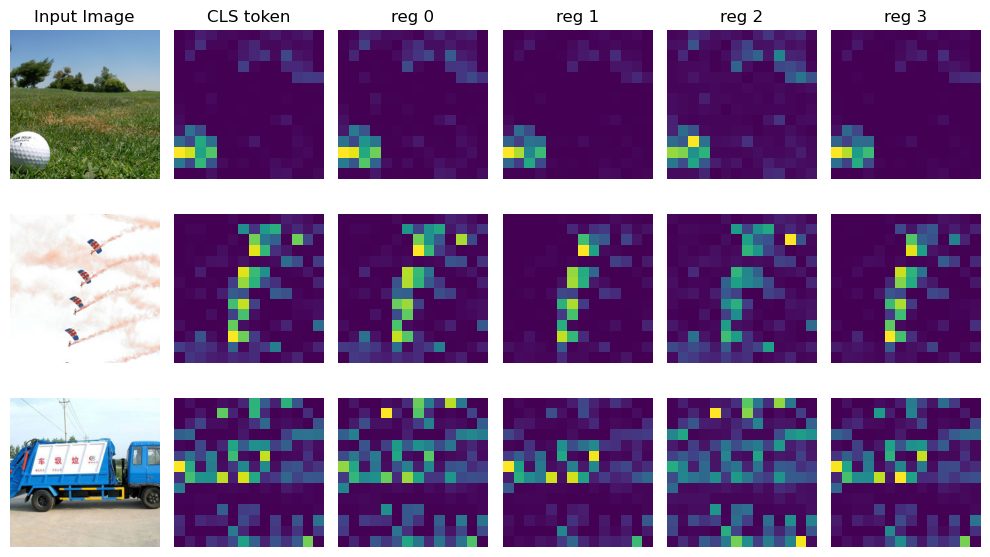

In [ ]:
# Load model
pths = os.listdir('checkpoints/reg_checkpoints')
pths.remove("log.txt")
pths.sort()

checkpoint =torch.load(f'checkpoints/reg_checkpoints/checkpoint.pth', map_location=torch.device('cpu'))
print('epoch', checkpoint['epoch'])

model = models_v2.vit_models(
    img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2.Layer_scale_init_Block)
model.default_cfg = models_v2._cfg()

model.load_state_dict(checkpoint["model"])

# Set up plot
output_format = ((model.num_regs + 1)*2, len(imgs)*2)
fig, ax = plt.subplots(len(imgs), model.num_regs+2, figsize=output_format)

for n_image, image in enumerate(chosen_imgs):

    # Display the original image
    x = to_tensor(image)
    img_resized = x.permute(1, 2, 0) * 0.5 + 0.5

    ax[n_image, 0].imshow(np.array(img_resized))
    ax[n_image, 0].axis('off')

    # Display the attention maps for each layer
    block = model.blocks[-1]
    block.attn.forward = my_forward_wrapper(block.attn)

    y = model(x.unsqueeze(0))
    cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, 4:].detach().view(14, 14)

    ax[n_image, 1].imshow(cls_weight)
    ax[n_image, 1].axis('off')

    reg_weights = block.attn.reg_attn_maps[0].mean(dim=0)

    for n, reg_token in enumerate(reg_weights):
        reg_weight =reg_weights[n, 4:].detach().view(14, 14)
        ax[n_image, n+2].imshow(reg_weight)
        ax[n_image, n+2].axis('off')



# Set titles only to first row
ax[0, 0].set_title('Input Image')
ax[0, 1].set_title('CLS token')
for i in range(model.num_regs):
    ax[0, i+2].set_title(f'reg {i}')

plt.tight_layout()
plt.show()

### reg_attn_epochs.ipynb
CLS tokens over layers<br>
CLS and register tokens over epochs<br>
Cosine similarity of register token over epochs

In [ ]:
import torch
import torch.nn as nn
from functools import partial

from timm.models import create_model
import torch.nn.functional as F
from torchvision.transforms import Compose, Resize, CenterCrop, Normalize, ToTensor
from deit_reg.models_v2 import deit_small_patch16_LS as deit_regs
from deit_source.models_v2 import deit_small_patch16_LS as deit_source
import deit_reg
import deit_source
from deit_reg import models_v2 as models_v2_regs
from deit_source import models_v2 as models_v2_source

from PIL import Image
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.gridspec as gridspec
import math
import random

import os

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str) -> list[list[str]]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.

  Returns:
    A nested list of all image paths in the subfolders.
  """

  files : list[list[str]] = []
  # Iterate through the subfolders in the given folder
  for subfolder in os.listdir(folder_path):
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    files.append(folder)

  return files
     

In [ ]:
folder_path = 'imagenette2/val/'
image_paths = get_paths_in_subfolders(folder_path)
sample_images = [Image.open(path[0]).convert("RGB") for path in image_paths]

In [ ]:
all_images = [Image.open(path[x]).convert("RGB") for path in image_paths for x in range(len(path))]

In [ ]:
good_paths = []
for file in os.listdir('data/good_examples/'):
  good_paths.append(['data/good_examples/' + file])
good = [Image.open(path[0]).convert("RGB") for path in good_paths]

bad_paths = []
for file in os.listdir('data/bad_examples/'):
  bad_paths.append(['data/bad_examples/' + file])
bad = [Image.open(path[0]).convert("RGB") for path in bad_paths]

good_and_bad = good + bad

In [ ]:
#code from https://github.com/huggingface/pytorch-image-models/discussions/1232+
def to_tensor(img):
    transform_fn = Compose([Resize(249, 3), CenterCrop(224), ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    return transform_fn(img)

def show_img(img):
    img = np.asarray(img)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()

def show_img2(img1, img2, alpha=0.8):
    img1 = np.asarray(img1)
    img2 = np.asarray(img2)
    plt.figure()
    plt.imshow(img1)
    plt.imshow(img2, alpha=alpha)
    plt.axis('off')
    plt.show()

def my_forward_wrapper(attn_obj):
    def my_forward(x):
        B, N, C = x.shape
        qkv = attn_obj.qkv(x).reshape(B, N, 3, attn_obj.num_heads, C // attn_obj.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv.unbind(0)   # make torchscript happy (cannot use tensor as tuple)

        attn = (q @ k.transpose(-2, -1)) * attn_obj.scale
        attn = attn.softmax(dim=-1)
        attn = attn_obj.attn_drop(attn)
        attn_obj.attn_map = attn
        attn_obj.cls_attn_map = attn[:, :, 0, 1:]
        attn_obj.reg_attn_maps = attn[:, :, 1:5, 1:]

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = attn_obj.proj(x)
        x = attn_obj.proj_drop(x)
        return x
    return my_forward

#original version
def show_first_10(model_name, images):
    for img in images[:10]:
        x = to_tensor(img)

        model = create_model(model_name, pretrained=True)
        model.blocks[-1].attn.forward = my_forward_wrapper(model.blocks[-1].attn)

        y = model(x.unsqueeze(0))
        attn_map = model.blocks[-1].attn.attn_map.mean(dim=1).squeeze(0).detach()
        cls_weight = model.blocks[-1].attn.cls_attn_map.mean(dim=1).view(14, 14).detach()

        img_resized = x.permute(1, 2, 0) * 0.5 + 0.5
        cls_resized = F.interpolate(cls_weight.view(1, 1, 14, 14), (224, 224), mode='bilinear').view(224, 224, 1)

        show_img(img)
        show_img(attn_map)
        show_img(cls_weight)
        show_img(img_resized)
        show_img2(img_resized, cls_resized, alpha=0.8)

#### CLS per layer

In [ ]:
pths = os.listdir('checkpoints/reg_checkpoints')
if "log.txt" in pths:
    pths.remove("log.txt")
if "best_checkpoint.pth" in pths:
    pths.remove("best_checkpoint.pth")
if "checkpoint.pth" in pths:
    pths.remove("checkpoint.pth")
if "deit_reg" in pths:
    pths.remove("deit_reg")

pths = sorted(pths, key=lambda x: int(x.split('checkpoint')[-1].split('.pth')[0]))
print(pths)
pths = [pths[-1]]
# n_imgs = 128
# idx = [random.randint(0, len(all_images)-1) for _ in range(n_imgs)]
# imgs = [all_images[id] for id in idx]

n_imgs = 128
idx = [random.randint(0, len(special)-1) for _ in range(n_imgs)]
imgs = [special[id] for id in idx]

for file in pths:
    checkpoint =torch.load(f'checkpoints/reg_checkpoints/{file}', map_location=torch.device('cpu'))
    print('epoch', checkpoint['epoch'])
    checkpoint_source = torch.load(f'checkpoints/source_checkpoints/{file}', map_location=torch.device('cpu'))
    
    model_source = models_v2_source.vit_models(
        img_size = 224, patch_size=16, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2_source.Layer_scale_init_Block)
    model_source.default_cfg = models_v2_source._cfg()

    model_source.load_state_dict(checkpoint_source["model"])

    model = models_v2_regs.vit_models(
        img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2_regs.Layer_scale_init_Block)
    model.default_cfg = models_v2_regs._cfg()

    print(checkpoint['model'].keys())

    model.load_state_dict(checkpoint["model"])

    # layers_to_visualize = range(model.get_num_layers())
    output_format = ((7)*2, len(imgs)*2)
    fig, ax = plt.subplots(len(imgs), 3 + model.num_regs, figsize=output_format)
    
    for n_image, image in enumerate(imgs):
        # Display the original image
        x = to_tensor(image)
        img_resized = x.permute(1, 2, 0) * 0.5 + 0.5

        ax[n_image, 0].imshow(np.array(img_resized))
        ax[n_image, 0].axis('off')
        ax[n_image, 0].set_title(idx[n_image])

        s_block = model_source.blocks[-1]
        s_block.attn.forward = my_forward_wrapper(s_block.attn)

        sy = model_source(x.unsqueeze(0))
        sattn_map = s_block.attn.attn_map.mean(dim=1).squeeze(0).detach()
        scls_weight =  s_block.attn.cls_attn_map.mean(dim=1).detach().view(14, 14)
        scls_resized = F.interpolate(scls_weight.view(1, 1, 14, 14), (224, 224), mode='bilinear').view(224, 224, 1)

        ax[n_image, 1].imshow(scls_weight)
        ax[n_image, 1].axis('off')

        # Display the attention maps for each layer
        block = model.blocks[-1]
        block.attn.forward = my_forward_wrapper(block.attn)

        y = model(x.unsqueeze(0))
        attn_map = block.attn.attn_map.mean(dim=1).squeeze(0).detach()
        cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, 4:].detach().view(14, 14)
        cls_resized = F.interpolate(cls_weight.view(1, 1, 14, 14), (224, 224), mode='bilinear').view(224, 224, 1)

        ax[n_image, 2].imshow(cls_weight)
        ax[n_image, 2].axis('off')

        reg_weights = block.attn.reg_attn_maps[0].mean(dim=0)

        for n, reg_token in enumerate(reg_weights):
            reg_weight = reg_weights[n, 4:].detach().view(14, 14)
            ax[n_image, n+3].imshow(reg_weight)
            ax[n_image, n+3].axis('off')



    # Set titles only to first row
    ax[0, 0].set_title('Input Image')
    ax[0, 1].set_title('CLS')
    ax[0, 2].set_title('CLS+reg')
    for i in range(model.num_regs):
        ax[0, i+3].set_title(f'reg {i}')

    # plt.xticks(list(layers_to_visualize))
    plt.tight_layout()
    plt.show()

#### CLS and REG tokens over epochs

0


/tmp/ipykernel_2058/2693479949.py:34: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.0, hspace=0.0)
/tmp/ipykernel_2058/2693479949.py:62: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case wh

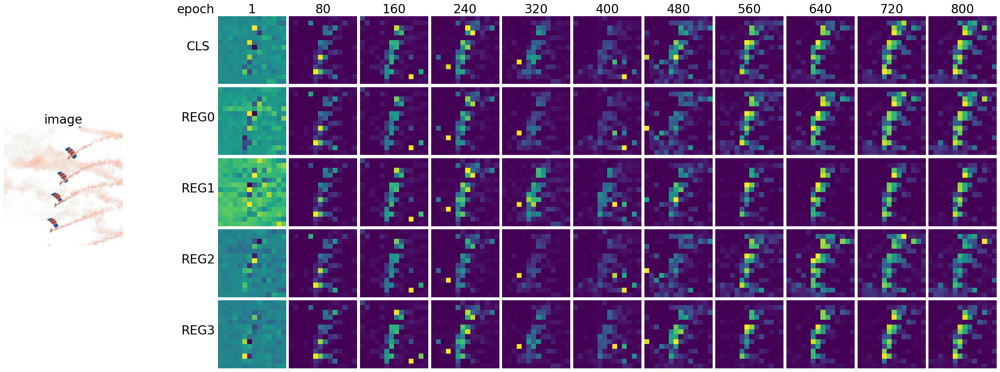

1


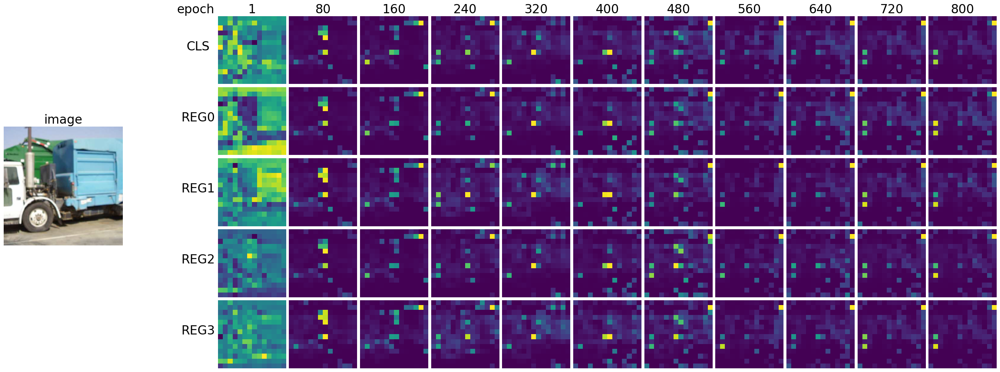

In [ ]:
pths = os.listdir('checkpoints/reg_checkpoints')
if "log.txt" in pths:
    pths.remove("log.txt")
if "best_checkpoint.pth" in pths:
    pths.remove("best_checkpoint.pth")
if "checkpoint.pth" in pths:
    pths.remove("checkpoint.pth")
if "deit_reg" in pths:
    pths.remove("deit_reg")

pths = sorted(pths, key=lambda x: int(x.split('checkpoint')[-1].split('.pth')[0]))
pths = [pths[i] for i in range(0, len(pths), 4)]#[::-1]
# n_imgs = 32
# idx = [random.randint(0, len(all_images)-1) for _ in range(n_imgs)]
# imgs = [all_images[id] for id in idx]
# print(idx)
imgs = good_and_bad
imgs = [imgs[0]] + [imgs[-3]]
idx = range(len(imgs))

gt_paths = pths.copy()

font_sz = 24

for j, img in enumerate(imgs):
    print(idx[j])

    output_format = ((len(pths)+2.5)*2, (1+4)*2)
    fig, ax = plt.subplots(1+4, len(pths)+1, figsize=output_format, constrained_layout=True, gridspec_kw={'width_ratios': [2.5] + (len(pths)) * [1]})
    plt.subplots_adjust(wspace=0.0, hspace=0.0)

    num_regs = 4
    model = models_v2_regs.vit_models(
        img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2_regs.Layer_scale_init_Block)
    model.default_cfg = models_v2_regs._cfg()

    x = to_tensor(img)
    img_resized = x.permute(1, 2, 0) * 0.5 + 0.5

    gs = plt.GridSpec(5, len(pths)+1, width_ratios=[1.5] + [1] * len(pths), figure=fig)

    ax_img = fig.add_subplot(gs[:, 0])
    ax_img.imshow(np.array(img_resized))
    ax_img.axis('off')
    ax_img.set_title('image', fontsize=font_sz)

    for row in range(5):
        ax[row, 0].axis('off')

    for i, file in enumerate(pths):
        i+=1
        checkpoint =torch.load(f'checkpoints/reg_checkpoints/{file}', map_location=torch.device('cpu'))

        model.load_state_dict(checkpoint["model"])

        x = to_tensor(img)
        img_resized = x.permute(1, 2, 0) * 0.5 + 0.5
        
        block = model.blocks[-1]
        block.attn.forward = my_forward_wrapper(block.attn)

        y = model(x.unsqueeze(0))
        attn_map = block.attn.attn_map.mean(dim=1).squeeze(0).detach()
        cls_weight =  block.attn.cls_attn_map.mean(dim=1)[:, 4:].detach().view(14, 14)
        cls_resized = F.interpolate(cls_weight.view(1, 1, 14, 14), (224, 224), mode='bilinear').view(224, 224, 1)

        ax[0, i].imshow(cls_weight)
        ax[0, i].axis('off')
        ax[0, i].set_title(checkpoint["epoch"] + 1, fontsize=font_sz)
        ax[0, i].set_aspect('equal')

        reg_weights = block.attn.reg_attn_maps[0].mean(dim=0)

        for l, reg_token in enumerate(reg_weights):
            reg_weight = reg_weights[l, 4:].detach().view(14, 14)
            ax[l+1, i].imshow(reg_weight)
            ax[l+1, i].axis('off')

    ax[0, 1].text(-9, -1.1, 'epoch', fontsize=font_sz)
    ax[0, 1].text(-7, 6.5, 'CLS', fontsize=font_sz)
    
    for k in range(num_regs):
        ax[k+1, 1].text(-8, 6.5, f'REG{k}', fontsize=font_sz)

    plt.show()

#### Cosine similarity reg tokens over epochs

epoch  0


/tmp/ipykernel_79233/3087762153.py:57: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f'../reg_checkpoints/{file}', map_location=device)  # Load check

cosine similarity 0.9953391594947524
epoch  19


Processing Images: 100%|██████████| 3925/3925 [02:05<00:00, 31.27img/s]


cosine similarity 0.875707678035566
epoch  39


Processing Images: 100%|██████████| 3925/3925 [02:05<00:00, 31.16img/s]


cosine similarity 0.9817235416060041
epoch  59


Processing Images: 100%|██████████| 3925/3925 [02:00<00:00, 32.66img/s]


cosine similarity 0.9762914668678478
epoch  79


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.91img/s]


cosine similarity 0.9599677242746778
epoch  99


Processing Images: 100%|██████████| 3925/3925 [02:02<00:00, 31.93img/s]


cosine similarity 0.9663941088907279
epoch  119


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.73img/s]


cosine similarity 0.9583408916528058
epoch  139


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.75img/s]


cosine similarity 0.9536878370403484
epoch  159


Processing Images: 100%|██████████| 3925/3925 [02:00<00:00, 32.48img/s]


cosine similarity 0.9442124478984031
epoch  179


Processing Images: 100%|██████████| 3925/3925 [02:03<00:00, 31.85img/s]


cosine similarity 0.9349614647695214
epoch  199


Processing Images: 100%|██████████| 3925/3925 [02:03<00:00, 31.80img/s]


cosine similarity 0.9722230974731931
epoch  219


Processing Images: 100%|██████████| 3925/3925 [02:03<00:00, 31.66img/s]


cosine similarity 0.9663198595897408
epoch  239


Processing Images: 100%|██████████| 3925/3925 [02:02<00:00, 31.91img/s]


cosine similarity 0.9626138008020486
epoch  259


Processing Images: 100%|██████████| 3925/3925 [02:02<00:00, 32.09img/s]


cosine similarity 0.9579875302314759
epoch  279


Processing Images: 100%|██████████| 3925/3925 [02:00<00:00, 32.44img/s]


cosine similarity 0.9515133470486683
epoch  299


Processing Images: 100%|██████████| 3925/3925 [02:00<00:00, 32.56img/s]


cosine similarity 0.962362365753028
epoch  319


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.87img/s]


cosine similarity 0.9650950598413018
epoch  339


Processing Images: 100%|██████████| 3925/3925 [02:03<00:00, 31.82img/s]


cosine similarity 0.9646199929030838
epoch  359


Processing Images: 100%|██████████| 3925/3925 [02:07<00:00, 30.85img/s]


cosine similarity 0.9570535729189588
epoch  379


Processing Images: 100%|██████████| 3925/3925 [02:00<00:00, 32.47img/s]


cosine similarity 0.9640258166896309
epoch  399


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.88img/s]


cosine similarity 0.9500266908991868
epoch  419


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.82img/s]


cosine similarity 0.9591070290431855
epoch  439


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.94img/s]


cosine similarity 0.9621037025208686
epoch  459


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.84img/s]


cosine similarity 0.9573356082484981
epoch  479


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.01img/s]


cosine similarity 0.9542493434316793
epoch  499


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.08img/s]


cosine similarity 0.9524593026774704
epoch  519


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.02img/s]


cosine similarity 0.9431479368543929
epoch  539


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.97img/s]


cosine similarity 0.9488690220626297
epoch  559


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.03img/s]


cosine similarity 0.9440207407277101
epoch  579


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.93img/s]


cosine similarity 0.9425915110490884
epoch  599


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.03img/s]


cosine similarity 0.941403619149688
epoch  619


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.01img/s]


cosine similarity 0.9383384510817802
epoch  639


Processing Images: 100%|██████████| 3925/3925 [01:59<00:00, 32.89img/s]


cosine similarity 0.941873710611064
epoch  659


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.00img/s]


cosine similarity 0.9338852085581251
epoch  679


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.03img/s]


cosine similarity 0.9278056786166634
epoch  699


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 32.99img/s]


cosine similarity 0.9296236910334058
epoch  719


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.01img/s]


cosine similarity 0.9352586413948399
epoch  739


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.02img/s]


cosine similarity 0.93003109342733
epoch  759


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.08img/s]


cosine similarity 0.9323304466229335
epoch  779


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 32.99img/s]


cosine similarity 0.9299048425741256
epoch  799


Processing Images: 100%|██████████| 3925/3925 [01:58<00:00, 33.02img/s]


cosine similarity 0.9289413252909472


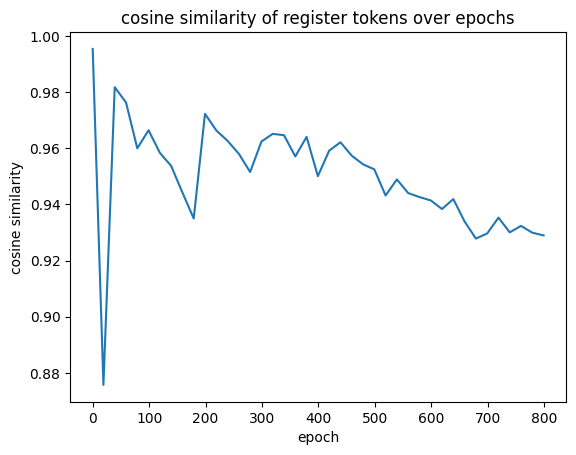

In [ ]:
pths = os.listdir('../reg_checkpoints')
if "log.txt" in pths:
    pths.remove("log.txt")
if "best_checkpoint.pth" in pths:
    pths.remove("best_checkpoint.pth")
if "checkpoint.pth" in pths:
    pths.remove("checkpoint.pth")
if "deit_reg" in pths:
    pths.remove("deit_reg")

pths = sorted(pths, key=lambda x: int(x.split('checkpoint')[-1].split('.pth')[0]))
pths = [pths[i] for i in range(0, len(pths), 1)]

num_regs = 4
model = models_v2_regs.vit_models(
    img_size = 224, patch_size=16, num_regs = 4, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4, qkv_bias=True,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),block_layers=models_v2_regs.Layer_scale_init_Block)
model.default_cfg = models_v2_regs._cfg()

imgs = all_images

import torch
import concurrent.futures
from tqdm import tqdm

# Set the device to GPU if available, otherwise fallback to CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Helper function to compute cosine similarity for one image
def compute_cosine_similarity_for_image(img, model, block, device):
    x = to_tensor(img).to(device)  # Move the image tensor to the GPU
    img_resized = x.permute(1, 2, 0) * 0.5 + 0.5

    y = model(x.unsqueeze(0))  # Perform inference on the GPU
    reg_weights = block.attn.reg_attn_maps[0].mean(dim=0)

    regs = []
    for l, reg_token in enumerate(reg_weights):
        regs.append(reg_weights[l, 4:].detach().view(14, 14))

    # calculate average cosine similarity between all pairs of reg tokens
    cos_sim = 0
    for i in range(len(regs)):
        for j in range(i + 1, len(regs)):
            cos_sim += F.cosine_similarity(regs[i].view(-1), regs[j].view(-1), dim=0)

    cos_sim /= len(regs) * (len(regs) - 1) / 2
    return cos_sim.item()

# Initialize cos_sim_list to store results
cos_sims = {}

# Move the model to the GPU
for file in pths:
    epoch = int(file.split('checkpoint')[-1].split('.pth')[0])
    print('epoch ', epoch)
    checkpoint = torch.load(f'../reg_checkpoints/{file}', map_location=device)  # Load checkpoint to GPU

    model.load_state_dict(checkpoint["model"])
    model.to(device)  # Ensure the model is on the GPU
    block = model.blocks[-1]
    block.attn.forward = my_forward_wrapper(block.attn)

    cos_sim_list = []

    # Use ThreadPoolExecutor to parallelize the for loop
    with concurrent.futures.ThreadPoolExecutor() as executor:
        # Use tqdm to show progress bar
        results = list(tqdm(executor.map(lambda img: compute_cosine_similarity_for_image(img, model, block, device), imgs),
                            total=len(imgs), desc="Processing Images", unit="img"))

        # Collect results from parallel execution
        cos_sim_list = results

    # Average cos_sim_list
    cos_sims[epoch] = np.mean(cos_sim_list)
    print('cosine similarity', cos_sims[epoch])

# Plot cosine similarity of register tokens over epochs
plt.plot(cos_sims.keys(), cos_sims.values())
plt.xlabel('epoch')
plt.ylabel('cosine similarity')
plt.title('cosine similarity of register tokens over epochs')
plt.show()




# Retraining DeiT-III with and without registers on SLURM cluster
Original files can be found in the /model/ directory

Please note that our adapted versions of the main.py files adapted from the official DeiT repository have most of the running arguments hardcoded due to issues with running on the SLURM cluster.

Train DeiT-III Small without registers for 800 epochs on a single node of 4 gpus and 72 cores using ImageNet1k<br>
```python -m torch.distributed.launch --nproc_per_node=4 --use_env deit_source/main.py --model deit_small_patch16_LS --output_dir <path to output directory> --data-path <path to ImageNet1k>```

Training log can be found in /model/output_source/log.txt

Train DeiT-III Small with registers for 800 epochs on a single node of 4 gpus and 72 cores using ImageNet1k<br>
```python -m torch.distributed.launch --nproc_per_node=4 --use_env deit_reg/main.py --model deit_small_patch16_LS --output_dir <path to output directory> --data-path <path to ImageNet1k>```

Training log can be found in /model/output_reg/log.txt

Evaluate DeiT-III Small without registers on a quarter node of 1 gpus and 18 cores using ImageNet1k<br>
```python -m torch.distributed.launch --nproc_per_node=1 --use_env deit_source/main.py --model deit_small_patch16_LS --eval --resume checkpoints/source_checkpoints/checkpoint.pth --data-path <path to ImageNet1k>```

```Creating model: deit_small_patch16_LS
number of params: 22059496
Test:  [  0/131]  eta: 0:23:49  loss: 0.5385 (0.5385)  acc1: 89.8438 (89.8438)  acc5: 97.6562 (97.6562)  time: 10.9126  data: 6.8630  max mem: 1584
Test:  [ 10/131]  eta: 0:02:10  loss: 0.7412 (0.7778)  acc1: 84.3750 (83.6174)  acc5: 96.8750 (96.4725)  time: 1.0808  data: 0.6241  max mem: 1585
Test:  [ 20/131]  eta: 0:01:08  loss: 0.6539 (0.6524)  acc1: 86.7188 (86.5203)  acc5: 96.8750 (96.9246)  time: 0.0976  data: 0.0003  max mem: 1585
Test:  [ 30/131]  eta: 0:00:45  loss: 0.6866 (0.7243)  acc1: 85.4167 (85.0386)  acc5: 97.1354 (96.7406)  time: 0.0976  data: 0.0003  max mem: 1585
Test:  [ 40/131]  eta: 0:00:34  loss: 0.8548 (0.7455)  acc1: 82.2917 (84.5147)  acc5: 96.8750 (96.8051)  time: 0.1293  data: 0.0319  max mem: 1585
Test:  [ 50/131]  eta: 0:00:26  loss: 0.7867 (0.7310)  acc1: 83.8542 (84.9673)  acc5: 97.3958 (96.9261)  time: 0.1379  data: 0.0405  max mem: 1585
Test:  [ 60/131]  eta: 0:00:22  loss: 0.8070 (0.7708)  acc1: 83.3333 (84.1402)  acc5: 95.5729 (96.5463)  time: 0.2046  data: 0.1072  max mem: 1585
Test:  [ 70/131]  eta: 0:00:17  loss: 1.0551 (0.8239)  acc1: 77.8646 (82.9519)  acc5: 94.0104 (96.1268)  time: 0.1960  data: 0.0986  max mem: 1585
Test:  [ 80/131]  eta: 0:00:14  loss: 1.0225 (0.8305)  acc1: 78.1250 (82.8189)  acc5: 94.2708 (95.9491)  time: 0.1727  data: 0.0753  max mem: 1585
Test:  [ 90/131]  eta: 0:00:10  loss: 0.9865 (0.8612)  acc1: 78.1250 (82.1286)  acc5: 94.2708 (95.6674)  time: 0.1726  data: 0.0753  max mem: 1585
Test:  [100/131]  eta: 0:00:08  loss: 1.0532 (0.8777)  acc1: 77.0833 (81.7889)  acc5: 92.9688 (95.4337)  time: 0.1958  data: 0.0985  max mem: 1585
Test:  [110/131]  eta: 0:00:05  loss: 1.0159 (0.8962)  acc1: 78.6458 (81.3438)  acc5: 93.7500 (95.2726)  time: 0.2658  data: 0.1685  max mem: 1585
Test:  [120/131]  eta: 0:00:02  loss: 0.9948 (0.9092)  acc1: 78.6458 (81.0305)  acc5: 94.5312 (95.1941)  time: 0.1676  data: 0.0702  max mem: 1585
Test:  [130/131]  eta: 0:00:00  loss: 0.9513 (0.9122)  acc1: 78.9062 (81.0540)  acc5: 95.3125 (95.2220)  time: 0.1659  data: 0.0707  max mem: 1585
Test: Total time: 0:00:32 (0.2512 s / it)
* Acc@1 81.054 Acc@5 95.222 loss 0.912
Accuracy of the network on the 50000 test images: 81.1%
```

Evaluate DeiT-III Small with registers on a quarter node of 1 gpu and 18 cores using ImageNet1k<br>
```python -m torch.distributed.launch --nproc_per_node=1 --use_env deit_reg/main.py --model deit_small_patch16_LS --eval --resume checkpoints/reg_checkpoints/checkpoint.pth --data-path <path to ImageNet1k>```

```Creating model: deit_small_patch16_LS
number of params: 22061032
Test:  [  0/131]  eta: 0:23:53  loss: 0.5241 (0.5241)  acc1: 88.2812 (88.2812)  acc5: 97.3958 (97.3958)  time: 10.9447  data: 6.7961  max mem: 1617
Test:  [ 10/131]  eta: 0:02:11  loss: 0.7341 (0.7795)  acc1: 83.0729 (83.0256)  acc5: 96.8750 (96.5199)  time: 1.0855  data: 0.6181  max mem: 1617
Test:  [ 20/131]  eta: 0:01:08  loss: 0.6256 (0.6498)  acc1: 87.7604 (86.2971)  acc5: 96.8750 (96.9370)  time: 0.0996  data: 0.0003  max mem: 1617
Test:  [ 30/131]  eta: 0:00:45  loss: 0.6752 (0.7255)  acc1: 85.6771 (84.6774)  acc5: 96.8750 (96.5894)  time: 0.0996  data: 0.0003  max mem: 1617
Test:  [ 40/131]  eta: 0:00:34  loss: 0.8789 (0.7441)  acc1: 80.4688 (84.2226)  acc5: 96.6146 (96.6908)  time: 0.1283  data: 0.0290  max mem: 1617
Test:  [ 50/131]  eta: 0:00:26  loss: 0.7788 (0.7307)  acc1: 83.5938 (84.5844)  acc5: 97.3958 (96.8239)  time: 0.1373  data: 0.0380  max mem: 1617
Test:  [ 60/131]  eta: 0:00:22  loss: 0.8369 (0.7720)  acc1: 80.9896 (83.6493)  acc5: 95.3125 (96.4097)  time: 0.2029  data: 0.1036  max mem: 1617
Test:  [ 70/131]  eta: 0:00:17  loss: 1.0591 (0.8245)  acc1: 77.6042 (82.5778)  acc5: 93.7500 (95.9544)  time: 0.1939  data: 0.0945  max mem: 1617
Test:  [ 80/131]  eta: 0:00:14  loss: 0.9837 (0.8306)  acc1: 78.6458 (82.5778)  acc5: 93.4896 (95.7530)  time: 0.1734  data: 0.0740  max mem: 1617
Test:  [ 90/131]  eta: 0:00:10  loss: 0.9857 (0.8615)  acc1: 78.6458 (81.9053)  acc5: 93.4896 (95.4585)  time: 0.1734  data: 0.0740  max mem: 1617
Test:  [100/131]  eta: 0:00:08  loss: 1.0590 (0.8767)  acc1: 75.7812 (81.5646)  acc5: 92.9688 (95.2816)  time: 0.1967  data: 0.0973  max mem: 1617
Test:  [110/131]  eta: 0:00:05  loss: 0.9955 (0.8950)  acc1: 78.1250 (81.1045)  acc5: 93.2292 (95.1084)  time: 0.2698  data: 0.1704  max mem: 1617
Test:  [120/131]  eta: 0:00:02  loss: 0.9964 (0.9093)  acc1: 78.1250 (80.8045)  acc5: 93.4896 (94.9961)  time: 0.1726  data: 0.0733  max mem: 1617
Test:  [130/131]  eta: 0:00:00  loss: 0.9528 (0.9121)  acc1: 78.9062 (80.8100)  acc5: 93.7500 (95.0320)  time: 0.1672  data: 0.0699  max mem: 1617
Test: Total time: 0:00:32 (0.2517 s / it)
* Acc@1 80.810 Acc@5 95.032 loss 0.912
Accuracy of the network on the 50000 test images: 80.8%
```

# Model comparison
Original files can be found in the /comparison/ directory

## dinov2_baseline.ipynb

In [ ]:
!git clone https://github.com/facebookresearch/dinov2

In [ ]:
!pip install -r comparison/dinov2/requirements.txt

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

import os

In [ ]:
device = torch.device("cuda")
folder_path = 'imagenette2/val'

#### Utilities

In [ ]:
# @title define preprocessing
class ResizeToMultiple:
  def __init__(self, multiple: int):
    self.multiple = multiple

  def __call__(self, img: Image.Image) -> Image.Image:
    width, height = img.size
    new_width = (width // self.multiple) * self.multiple
    new_height = (height // self.multiple) * self.multiple
    resize_transform = transforms.Resize((new_height, new_width))
    return resize_transform(img)

# Define preprocessing transformations
preprocess = transforms.Compose([
  ResizeToMultiple(14),
  transforms.ToTensor(),          # Convert image to PyTorch tensor
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

# Define preprocessing transformations
preprocess_batch = transforms.Compose([
  transforms.Resize((252, 252)),
  transforms.ToTensor(),          # Convert image to PyTorch tensor
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

In [ ]:
# @title generate attention maps
def get_attention_maps(model,
                       input_tensor,
                       layers: list[int],
                       truncate_norms: int|bool = False):
  # Perform forward pass to get attention maps
    with torch.no_grad():
      output = model.get_intermediate_layers(input_tensor,
                                              n=layers,
                                              reshape=True,
                                              return_class_token=False,
                                              norm=False)

    att_maps = []
    norms_list = []
    layer_list = []
    # For each layer, extract feature vector and compute norms
    for n, layer in enumerate(output):
      # attention maps have shape [embedding_dim, height, width], reorder to have embedding channel last
      att = layer.squeeze().cpu().numpy().transpose(1, 2, 0)
      print(att.shape)
      norms = np.linalg.norm(att, ord=np.inf, axis=2)
      # norms = np.linalg.norm(att, axis=2)
      print(norms.shape)
      if truncate_norms:
        norms = np.clip(norms, 0, truncate_norms)
      norms_list.append(norms.flatten())
      att_maps.append(norms)
      layer_list.extend([n]*np.prod(norms.shape))

    norms_list = np.array(norms_list).flatten()
    layer_list = np.array(layer_list)

    return att_maps, norms_list, layer_list

In [ ]:
# @title Visualize attention maps
def visualize_attention_maps(model,
                             images,
                             layers_to_visualize,
                             truncate_norms=0,
                             show_norms=False,
                             output_format="auto",
                             **kwargs):

  device = torch.device("cuda")
  layers_total = model.n_blocks
  i_offset = 2 if show_norms else 1

  model.to(device)
  if output_format == "auto":
    output_format = ((len(layers_to_visualize)+i_offset)*2, len(images)*2)

  # Set up the plot with an extra column for the norms
  fig, ax = plt.subplots(len(images), i_offset + len(layers_to_visualize),
                          figsize=output_format)

  # reshape plt axes in case of a single row
  if len(images) == 1:
    ax = ax.reshape(1, -1)

  for n_image, image in enumerate(images):
    # Apply preprocessing
    input_tensor = preprocess(image).unsqueeze(0)  # Add batch dimension
    input_tensor = input_tensor.to(device)

    att_maps, norms_list, layer_list = get_attention_maps(model,
                                                          input_tensor,
                                                          layers_total,
                                                          truncate_norms)

    # Display the original image
    ax[n_image, 0].imshow(np.array(image))
    ax[n_image, 0].axis('off')

    # Optionally display the norm distribution across layers
    if show_norms:
      heatmap, xedges, yedges = np.histogram2d(layer_list, norms_list,
                                               bins=[layers_total, 50])
      heatmap[heatmap == 0] = heatmap[heatmap > 0].min()/10
      ax[n_image, 1].imshow(heatmap.T, aspect=0.7, cmap='viridis',
                            origin='lower', norm=LogNorm())
      ax[n_image, 1].xaxis.set_visible(False)

    # Display the attention maps for each layer
    for n, i_map in enumerate(layers_to_visualize):
      ax[n_image, n+i_offset].imshow(att_maps[i_map], norm=LogNorm())
      ax[n_image, n+i_offset].axis('off')

  # Set titles only to first row
  ax[0, 0].set_title('Input Image')
  if show_norms:
    ax[0, 1].set_title('Norm Distribution')
    ax[-1, 1].xaxis.set_visible(True)
    ax[-1, 1].set_xlabel('Layer')
  for i in range(len(layers_to_visualize)):
    ax[0, i+i_offset].set_title(f'Layer {layers_to_visualize[i]}')

  plt.tight_layout()
  plt.show()

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str,
                            flat: bool = False
                            ) -> list[list[str]] | list[str]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.
    flat: If True, returns a list of all image paths in the subfolders.
          If False, returns a nested list of all image paths in the subfolders.

  Returns:
    A list of all image paths in the subfolders.
  """

  files= []
  # Iterate through the subfolders in the given folder
  for subfolder in os.listdir(folder_path):
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    if flat:
      files.extend(folder)
    else:
      files.append(folder)

  return files

In [ ]:
# @title generate average norms
def visualize_average_norms(model, image_batches, truncate_norms: int | bool = False):
  model.to(device)
  layers_total = model.n_blocks
  norms_list = []
  layers_list = []

  for images in image_batches:
    images = images.to(device)
    with torch.no_grad():
      output = model.get_intermediate_layers(images,
                                              n=model.n_blocks,
                                              reshape=False,
                                              return_class_token=False,
                                              norm=False)

    # For each layer, extract feature vector and compute norms
    for n, layer in enumerate(output):
      att = layer.cpu().numpy() # (batch, tokens, embed_dim)
      norms = np.linalg.norm(att, axis=2).reshape((-1,)) # (batch*tokens)
      if truncate_norms:
        norms = np.clip(norms, 0, truncate_norms)

      norms_list.extend(norms.tolist())
      layers_list.extend([n]*np.prod(norms.shape))

  norms_array = np.array(norms_list)
  layers_array = np.array(layers_list)


  heatmap, xedges, yedges = np.histogram2d(layers_array, norms_array,
                                              bins=[layers_total, 50])
  heatmap[heatmap == 0] = heatmap[heatmap > 0].min()/10
  plt.imshow(heatmap.T, aspect=0.7, cmap='viridis',
                      origin='lower', norm=LogNorm())
  plt.xlabel('Layer')
  plt.ylabel('Norm')
  plt.title('Norm Distribution Across Layers')
  plt.show()


#### Setup

In [ ]:
image_paths = get_paths_in_subfolders(folder_path)
sample_images = [Image.open(path[0]).convert("RGB") for path in image_paths]

#### Load Large

In [ ]:
dinov2_large = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_large.eval()

In [ ]:
dinov2_large_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14_reg')
dinov2_large_reg.eval()

#### Load Giant

In [ ]:
dinov2_giant = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14')
dinov2_giant.eval()

In [ ]:
dinov2_giant_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14_reg')
dinov2_giant_reg.eval()

#### Evaluate models on small sample

In [ ]:
layers_large = dinov2_large.n_blocks
layers_giant = dinov2_giant.n_blocks

n_samples = 10

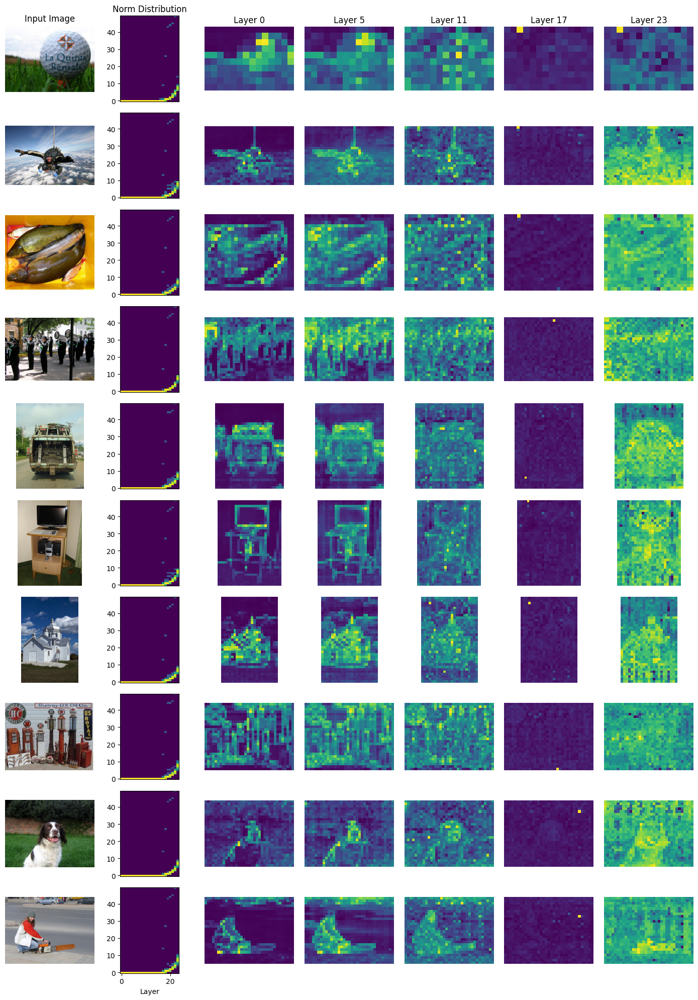

In [ ]:
visualize_attention_maps(dinov2_large,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 5, 11, 17, 23),
                         show_norms=True,
                         truncate_norms=300)

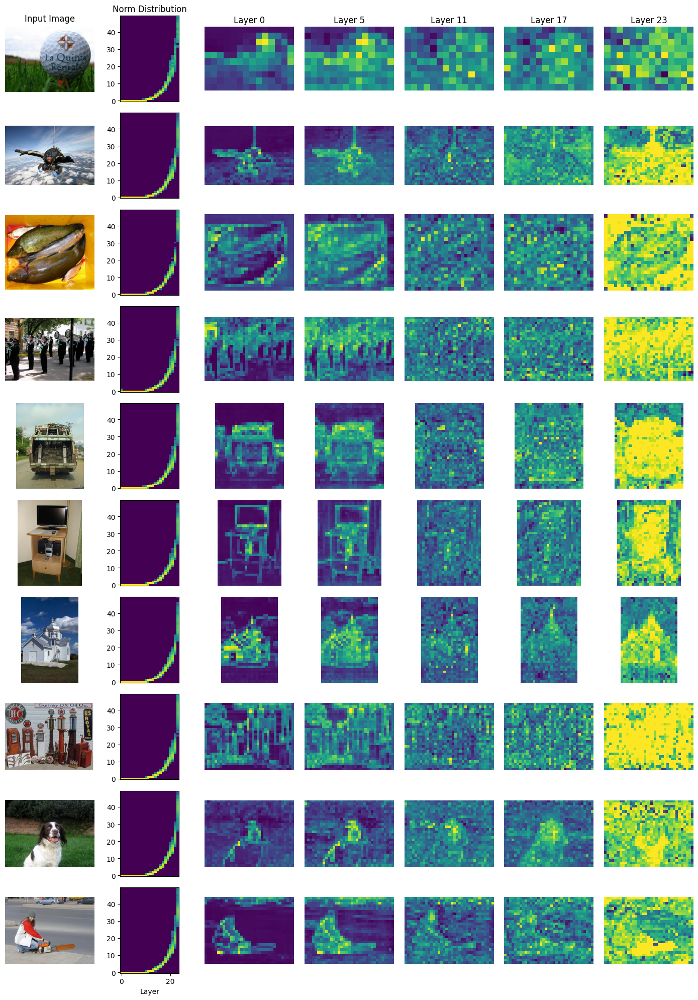

In [ ]:
visualize_attention_maps(dinov2_large_reg,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 5, 11, 17, 23),
                         show_norms=True,
                         truncate_norms=300)

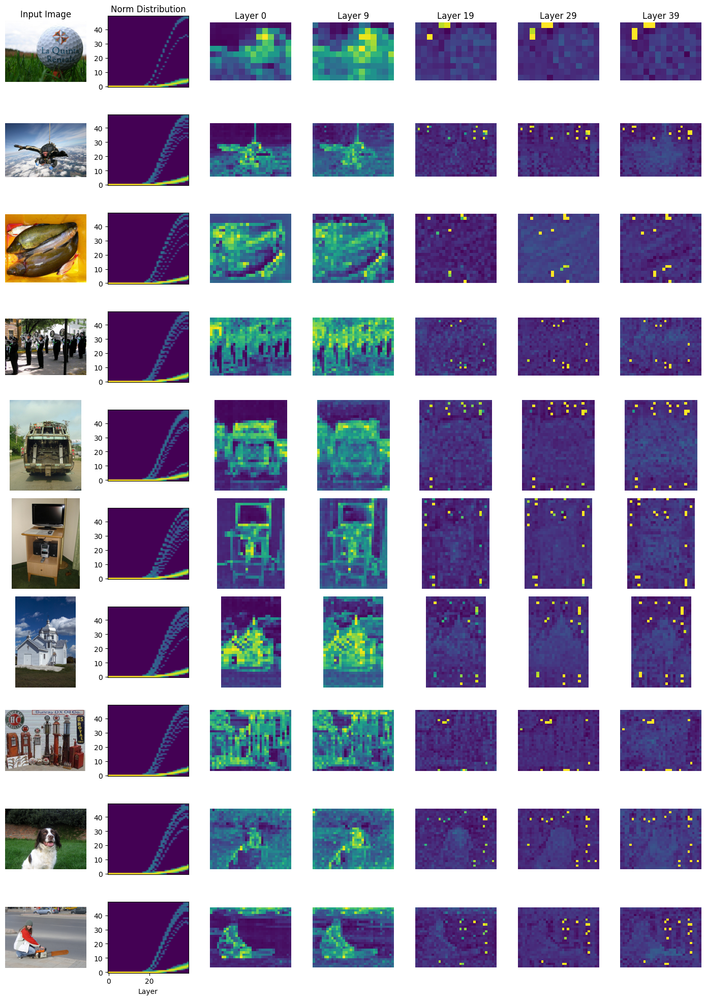

In [ ]:
visualize_attention_maps(dinov2_giant,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 9, 19, 29, 39),
                         show_norms=True,
                         truncate_norms=300)

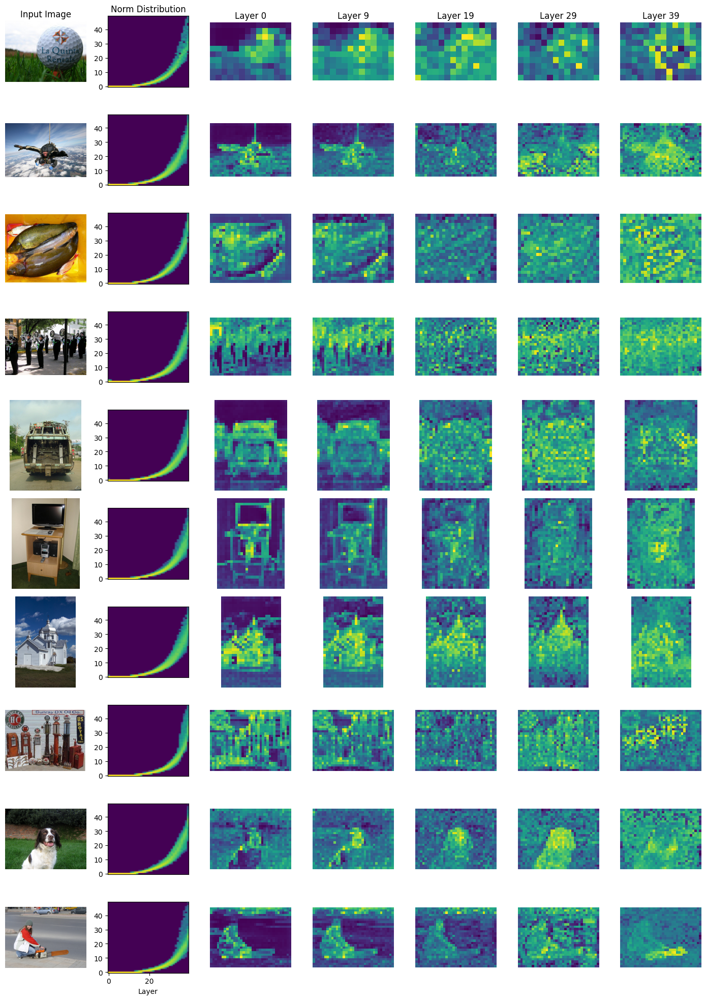

In [ ]:
visualize_attention_maps(dinov2_giant_reg,
                          sample_images[:n_samples],
                          layers_to_visualize=(0, 9, 19, 29, 39),
                          truncate_norms=300,
                          show_norms=True)

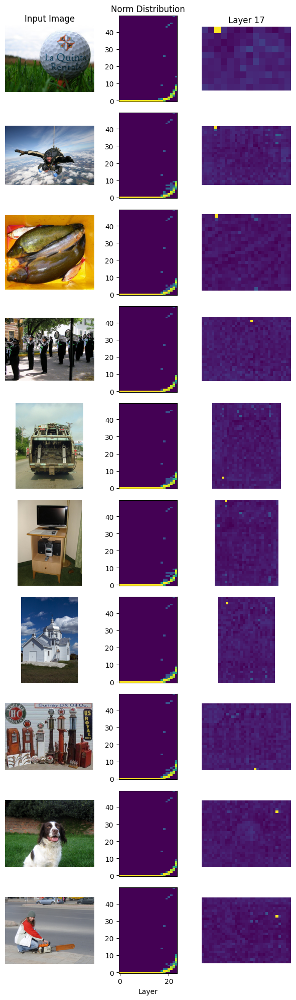

In [ ]:
visualize_attention_maps(dinov2_large,
                         sample_images[:10],
                         layers_to_visualize=[17],
                         show_norms=True,
                         truncate_norms=300)

#### Quantative Analysis

In [ ]:
sample_images_large = [preprocess_batch(Image.open(path).convert("RGB")) for folder in image_paths for path in folder[:100]]
sample_images_large = torch.tensor(np.array(sample_images_large))
sample_images_batched = sample_images_large.split(32)

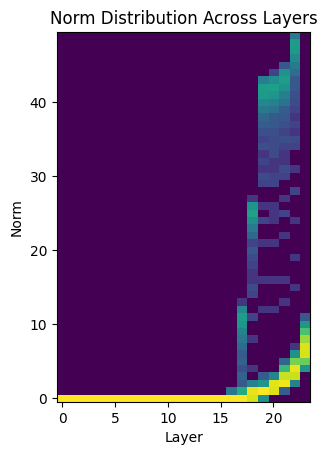

In [ ]:
visualize_average_norms(dinov2_large, sample_images_batched)

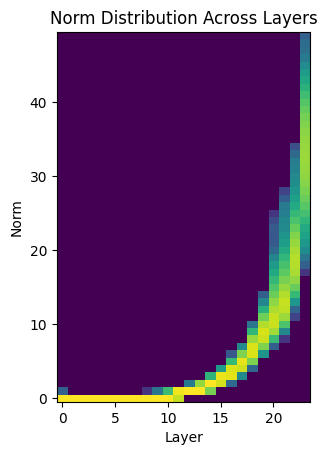

In [ ]:
visualize_average_norms(dinov2_large_reg, sample_images_batched)

/usr/local/lib/python3.10/dist-packages/xformers/ops/unbind.py:46: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  storage_data_ptr = tensors[0].storage().data_ptr()
/usr/local/lib/python3.10/dist-packages/xformers/ops/unbind.py:48: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if x.storage().data_ptr() != storage_data_ptr:


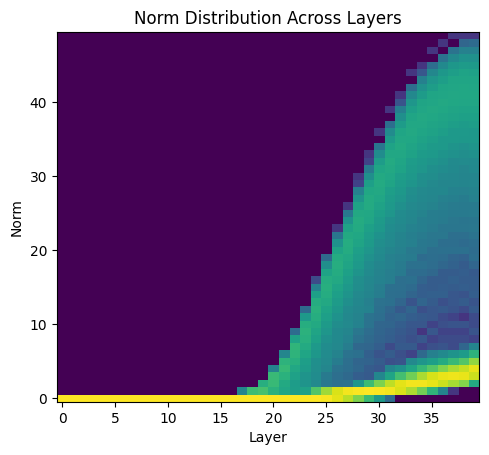

In [ ]:
visualize_average_norms(dinov2_giant, sample_images_batched)

/usr/local/lib/python3.10/dist-packages/xformers/ops/unbind.py:46: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  storage_data_ptr = tensors[0].storage().data_ptr()
/usr/local/lib/python3.10/dist-packages/xformers/ops/unbind.py:48: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if x.storage().data_ptr() != storage_data_ptr:


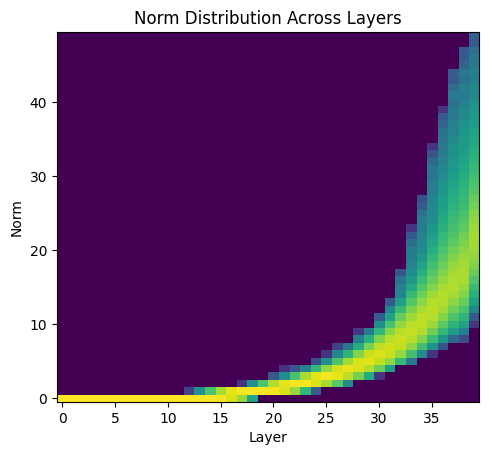

In [ ]:
visualize_average_norms(dinov2_giant_reg, sample_images_batched)

#### Free up memory

In [ ]:
del dinov2_large

In [ ]:
del dinov2_large_reg

In [ ]:
del dinov2_giant

In [ ]:
del dinov2_giant_reg

In [ ]:
torch.cuda.empty_cache()

## dinov4_baseline.ipynb

In [ ]:
!git clone https://github.com/facebookresearch/dinov2

In [ ]:
!pip install -r comparison/dinov2/requirements.txt

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

import os

#### Utilities

In [3]:
class ResizeToMultiple:
  def __init__(self, multiple: int):
    self.multiple = multiple

  def __call__(self, img: Image.Image) -> Image.Image:
    width, height = img.size
    new_width = (width // self.multiple) * self.multiple
    new_height = (height // self.multiple) * self.multiple
    resize_transform = transforms.Resize((new_height, new_width))
    return resize_transform(img)

# Define preprocessing transformations
preprocess = transforms.Compose([
  ResizeToMultiple(14),
  transforms.ToTensor(),    a      # Convert image to PyTorch tensor
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

In [ ]:
def get_attention_maps(model,
                       input_tensor,
                       layers,
                       truncate_norms):
  # Perform forward pass to get attention maps
    with torch.no_grad():
      output = model.get_intermediate_layers(input_tensor,
                                              n=layers,
                                              reshape=True,
                                              return_class_token=False,
                                              norm=False)

    att_maps = []
    norms_list = []
    layer_list = []
    # For each layer, extract feature vector and compute norms
    for n, layer in enumerate(output):
      # attention maps have shape [embedding_dim, height, width], reorder
      att = layer.squeeze().cpu().numpy().transpose(1, 2, 0)
      norms = np.linalg.norm(att, axis=2)
      norms_list.append(norms.flatten())
      if truncate_norms:
        norms = np.clip(norms, 0, truncate_norms)
      att_maps.append(norms)
      layer_list.extend([n]*np.prod(norms.shape))

    norms_list = np.array(norms_list).flatten()
    layer_list = np.array(layer_list)

    return att_maps, norms_list, layer_list

In [ ]:
# @title Visualize attention maps
def visualize_attention_maps(model,
                             images,
                             layers_to_visualize,
                             truncate_norms=0,
                             show_norms=False,
                             output_format="auto",
                             **kwargs):

  device = torch.device("cuda")
  layers_total = model.n_blocks
  i_offset = 2 if show_norms else 1

  model.to(device)
  if output_format == "auto":
    output_format = ((len(layers_to_visualize)+i_offset)*2, len(images)*2)

  # Set up the plot with an extra column for the norms
  fig, ax = plt.subplots(len(images), i_offset + len(layers_to_visualize),
                          figsize=output_format)

  # reshape plt axes in case of a single row
  if len(images) == 1:
    ax = ax.reshape(1, -1)

  for n_image, image in enumerate(images):
    # Apply preprocessing
    input_tensor = preprocess(image).unsqueeze(0)  # Add batch dimension
    input_tensor = input_tensor.to(device)

    att_maps, norms_list, layer_list = get_attention_maps(model,
                                                          input_tensor,
                                                          layers_total,
                                                          truncate_norms)

    # Display the original image
    ax[n_image, 0].imshow(np.array(image))
    ax[n_image, 0].axis('off')

    # Optionally display the norm distribution across layers
    if show_norms:
      heatmap, xedges, yedges = np.histogram2d(layer_list, norms_list,
                                               bins=[layers_total, 50])
      heatmap[heatmap == 0] = heatmap[heatmap > 0].min()/10
      ax[n_image, 1].imshow(heatmap.T, aspect=0.7, cmap='viridis',
                            origin='lower', norm=LogNorm())
      ax[n_image, 1].xaxis.set_visible(False)

    # Display the attention maps for each layer
    for n, i_map in enumerate(layers_to_visualize):
      ax[n_image, n+i_offset].imshow(att_maps[i_map], norm=LogNorm())
      ax[n_image, n+i_offset].axis('off')

  # Set titles only to first row
  ax[0, 0].set_title('Input Image')
  if show_norms:
    ax[0, 1].set_title('Norm Distribution')
    ax[-1, 1].xaxis.set_visible(True)
    ax[-1, 1].set_xlabel('Layer')
  for i in range(len(layers_to_visualize)):
    ax[0, i+i_offset].set_title(f'Layer {layers_to_visualize[i]}')

  plt.tight_layout()
  plt.show()

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str) -> list[list[str]]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.

  Returns:
    A nested list of all image paths in the subfolders.
  """

  files : list[list[str]] = []
  # Iterate through the subfolders in the given folder
  for subfolder in os.listdir(folder_path):
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    files.append(folder)

  return files

#### Setup

In [ ]:
folder_path = 'imagenette2/val'
image_paths = get_paths_in_subfolders(folder_path)
sample_images = [Image.open(path[0]).convert("RGB") for path in image_paths]

#### Load models

In [ ]:
dinov2_large = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_large.eval()

In [ ]:
dinov2_large_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14_reg')
dinov2_large_reg.eval()

In [ ]:
dinov2_giant = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14')
dinov2_giant.eval()

In [ ]:
dinov2_giant_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14_reg')
dinov2_giant_reg.eval()

#### Evaluate models

In [ ]:
layers_large = dinov2_large.n_blocks
layers_giant = dinov2_giant.n_blocks

n_samples = 10

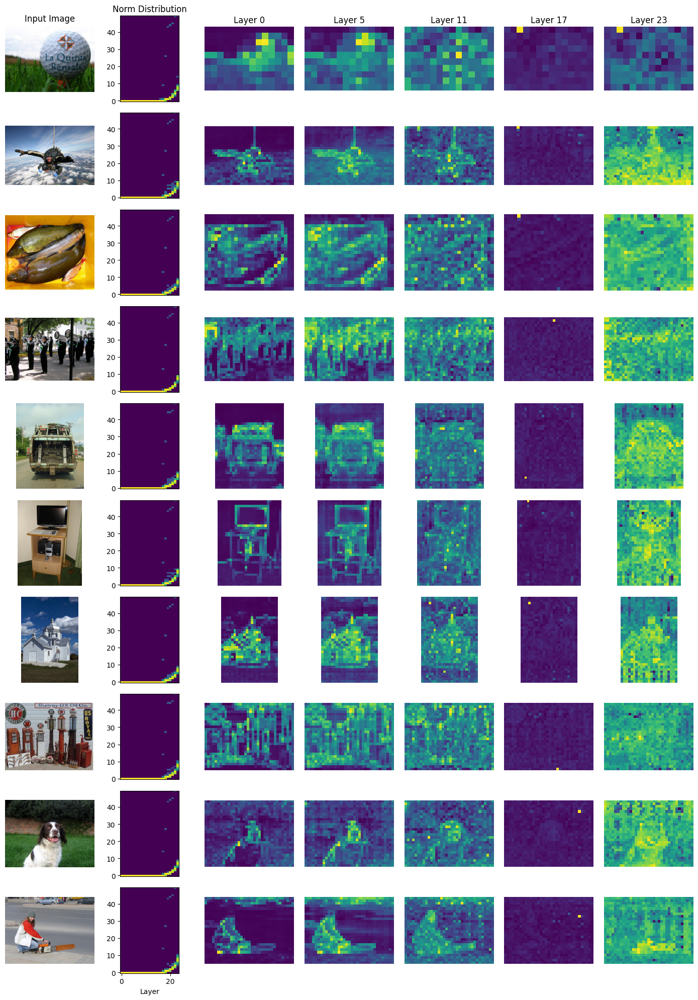

In [ ]:
visualize_attention_maps(dinov2_large,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 5, 11, 17, 23),
                         show_norms=True,
                         truncate_norms=300)

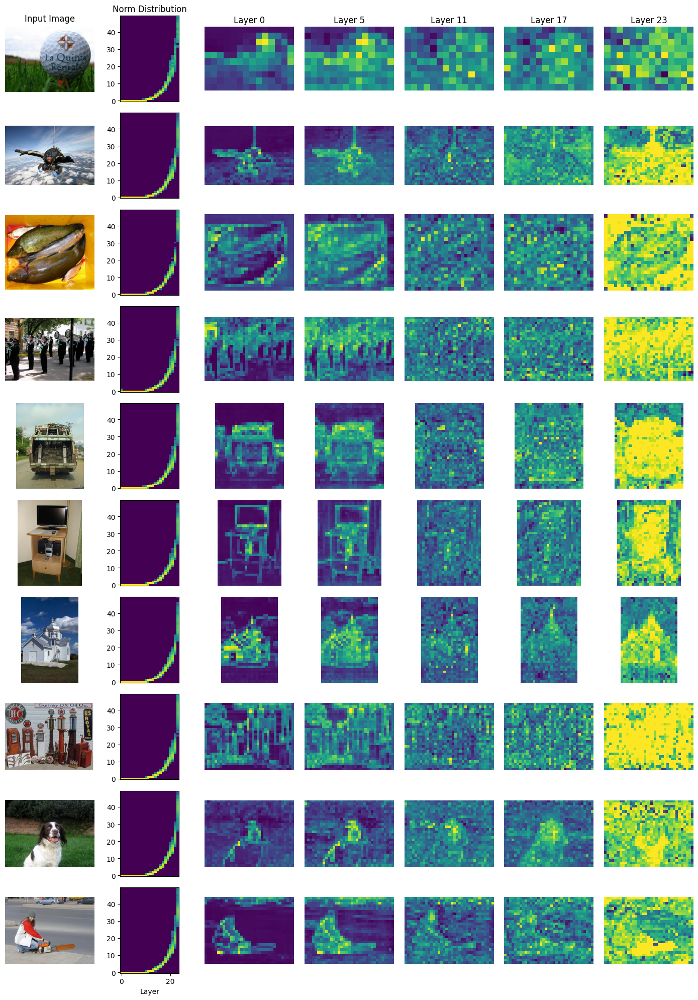

In [ ]:
visualize_attention_maps(dinov2_large_reg,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 5, 11, 17, 23),
                         show_norms=True,
                         truncate_norms=300)

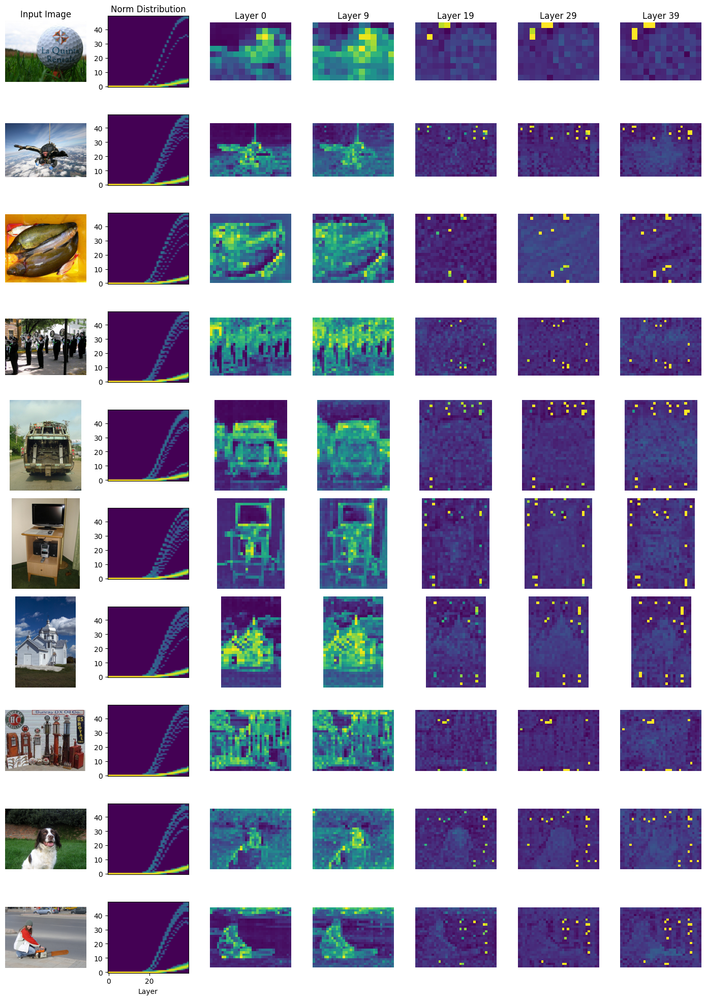

In [ ]:
visualize_attention_maps(dinov2_giant,
                         sample_images[:n_samples],
                         layers_to_visualize=(0, 9, 19, 29, 39),
                         show_norms=True,
                         truncate_norms=300)m

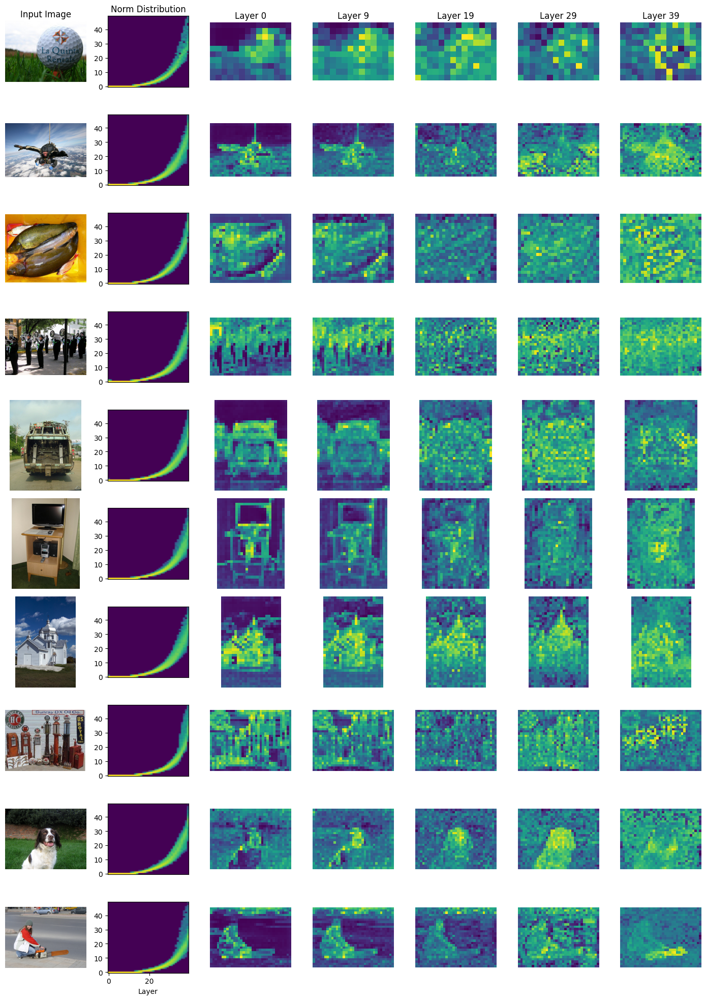

In [ ]:
visualize_attention_maps(dinov2_giant_reg,
                          sample_images[:n_samples],
                          layers_to_visualize=(0, 9, 19, 29, 39),
                          truncate_norms=300,
                          show_norms=True)

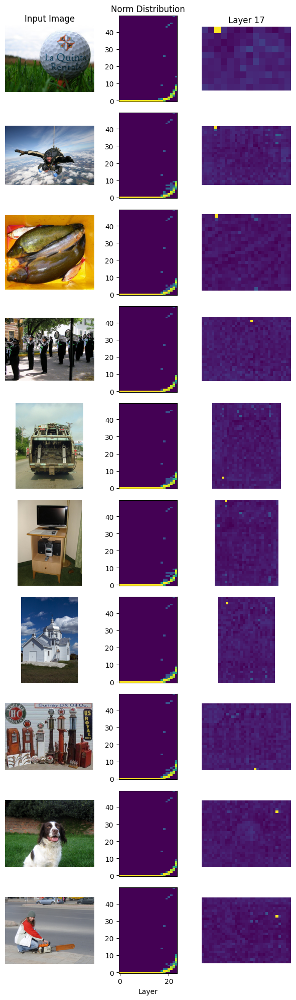

In [ ]:
visualize_attention_maps(dinov2_large,
                         sample_images[:10],
                         layers_to_visualize=[17],
                         show_norms=True,
                         truncate_norms=300)

#### Quantative Analysis

In [ ]:
def visualize_average_norms(model, images):
  device = torch.device("cuda")
  model.to(device)
  layers_total = model.n_blocks

  norms_list = []
  layers_list = []
  for image in images:
    # Apply preprocessing
    input_tensor = preprocess(image).unsqueeze(0)  # Add batch dimension
    input_tensor = input_tensor.to(device)
    _, norms, layers = get_attention_maps(model,
                                                          input_tensor,
                                                          layers_total,
                                                          truncate_norms=0)
    norms_list.append(norms)
    layers_list.append(layers)

  norms_list = np.array(norms_list).flatten()
  layers_list = np.array(layers_list).flatten()


  heatmap, xedges, yedges = np.histogram2d(layers_list, norms_list,
                                               bins=[layers_total, 50])
  heatmap[heatmap == 0] = heatmap[heatmap > 0].min()/10
  plt.imshow(heatmap.T, aspect=0.7, cmap='viridis',
                        origin='lower', norm=LogNorm())
  plt.xlabel('Layer')
  plt.ylabel('Norm')
  plt.title('Norm Distribution Across Layers')
  plt.show()


In [ ]:
sample_images_large = [Image.open(path).convert("RGB") for path in folder[:100] for folder in image_paths]

In [ ]:
visualize_average_norms(dinov2_large, sample_images_large)

In [ ]:
visualize_average_norms(dinov2_large_reg, sample_images_large)

In [ ]:
visualize_average_norms(dinov2_giant, sample_images_large)

In [ ]:
visualize_average_norms(dinov2_giant_reg, sample_images_large)

## model_comparison.ipynb

### Registers in ViTs

This notebook contains code to replicate and extend the works of Darcet et al. 2024 in [Vision Transformers Need Registers](https://arxiv.org/abs/2309.16588)

#### Setup

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision import datasets

import timm
from timm.models._features import feature_take_indices

import numpy as np

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

from PIL import Image

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from tqdm.notebook import tqdm

import os
from typing import Sequence, List, Tuple, Union, Optional, Any
from functools import partial
from collections import defaultdict

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
import checkpoints.deit_reg as lib_deit_reg;
import deit_source as lib_deit_source;

import model.deit_reg.models_v2 as models_reg;
import model.deit_source.models_v2 as models_source;

from model.deit_reg.models_v2 import deit_small_patch16_LS as deit_reg_small;
from model.deit_source.models_v2 import deit_small_patch16_LS as deit_source_small;

In [ ]:
import matplotlib as mpl
import matplotlib.font_manager as fm
print(mpl.__version__)

!wget -O TimesNewRoman.ttf https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf
font_dirs = ["/content/"]
font_files = fm.findSystemFonts(fontpaths=font_dirs, fontext='ttf')
for font_file in font_files:
    print(font_file) if 'TimesNewRoman' in font_file else None
    fm.fontManager.addfont(font_file)

plt.rcParams["font.family"] = "Times New Roman"


In [ ]:
VALID_MAPS = ["spatial_embs",
                "spatial_atts",
                "spatial_mlps",
                "prefix_embs",
                "prefix_atts",
                "prefix_mlps"
  ]

MODELS_PATH = {"registers": "checkpoints/reg_checkpoints",
               "source": "checkpoints/source_checkpoints"}

DATA_SOURCE = 'datasets/'
DATA_PATH = "imagenette2/"

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
IMAGENET_DEFAULT_MEAN = (0.485, 0.456, 0.406)
IMAGENET_DEFAULT_STD = (0.229, 0.224, 0.225)

preprocess = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.ToTensor(),
      transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.shape[0] == 1 else x),
      transforms.Normalize(mean=IMAGENET_DEFAULT_MEAN,
                            std=IMAGENET_DEFAULT_STD)
  ])


In [ ]:
download = True
if os.path.exists(DATA_SOURCE + "imagenette2.tgz"):
  !mkdir {DATA_PATH}
  !tar -xzf {DATA_SOURCE + "imagenette2.tgz"} -C {DATA_PATH}
  download = False


dataset = datasets.Imagenette(
  root=DATA_PATH,
  download=download,
  transform=preprocess
)

data_loader = DataLoader(dataset, batch_size=32, shuffle=True)


In [ ]:
n_samples = 10
sample_images, sample_labels = next(iter(data_loader))
assert len(sample_images) >= n_samples
sample = sample_images[:n_samples]

#### Utilities

In [ ]:
# @title generate intermediate maps for embeddings, attention and mlp
def get_all_intermediates(model,
                          input_tensor,
                          layers: int,
                          **kwargs) -> dict:

  # Perform forward pass to get feature normal maps
  with torch.no_grad():
    if "get_intermediate_layers" in dir(model):
      out = model.get_intermediate_layers(input_tensor,
                                            n=layers,
                                            reshape=True,
                                            return_class_token=True,
                                            norm=False)

      outs = {"spatial_embs": [e[0].cpu().numpy().transpose((0,2,3,1))
                              for e in out],
              "prefix_embs": [np.expand_dims(e[1].cpu().numpy(), axis=1)
                              for e in out]}

    elif "forward_intermediates" in dir(model):
      emb, att, mlp, cls = custom_forward(model,
                                     input_tensor,
                                     intermediates_only=True,
                                     return_att_mlp=True,
                                     return_prefix_tokens=True,
                                     )
      outs = dict()
      outs["spatial_embs"] = [e.cpu().numpy() for e in emb]
      outs["spatial_atts"] = [a.cpu().numpy() for a in att]
      outs["spatial_mlps"] = [m.cpu().numpy() for m in mlp]
      outs["prefix_atts"] = [c.cpu().numpy() for c in cls]

    else:
      try:
        outs = reg_forward(model,
                           input_tensor,
                           return_intermed=True,
                           return_att_mlp=True,
                           return_prefix_tokens=True,
                           convert_to_numpy=True,
                           )
      except Exception as e:
        raise ValueError("Model not supported")

  return outs

In [ ]:
# @title Visualize normal and attention maps for individual images
def visualize_emb_att_mlp(model,
                          images,
                          layers_to_visualize: int | Sequence ,
                          maps_to_visualize: Sequence[str],
                          output_format="auto",
                          **kwargs):

  if not model:
    return

  if isinstance(layers_to_visualize, int):
    layers_to_visualize = list(range(layers_to_visualize))

  if any([i not in VALID_MAPS for i in maps_to_visualize]):
    raise ValueError(f"maps_to_visualize must be one of {VALID_MAPS}")

  layers_total = max(layers_to_visualize) + 1
  try:
    layers_total = model.n_blocks
  except AttributeError:
    pass

  model.to(device)

  vis_data = []

  # run model on images, extract the intermediate information and process it
  for n_image, input_tensor in enumerate(images):
    if len(input_tensor.shape) == 3:
      input_tensor = input_tensor.unsqueeze(0)
    input_tensor = input_tensor.to(device)

    data = get_all_intermediates(model, input_tensor, layers_total)
    vis_data.append({map: data[map] for map in maps_to_visualize})

  # Visualize spatial tokens
  if any([m.startswith("spatial") for m in maps_to_visualize]):
    spatial_maps = [i for i in maps_to_visualize if i.startswith("spatial")]
    plot_spatial(images, vis_data, layers_to_visualize, spatial_maps, output_format,
                 log_norm=kwargs.get("log_norm", True),
                 norm_along_layers=kwargs.get("norm_along_layers", False))

  # Visualize prefix tokens

  if any([m.startswith("prefix") for m in maps_to_visualize]):
    prefix_maps = [i for i in maps_to_visualize if i.startswith("prefix")]
    plot_prefix(images, vis_data, layers_to_visualize, prefix_maps, output_format)


In [ ]:
# @title plot spatial tokens (patches)
def plot_spatial(images,
                 vis_data,
                 layers_to_visualize,
                 maps_to_visualize,
                 output_format="auto",
                 log_norm=True,
                 norm_along_layers=False):

  if any([m.startswith("prefix") for m in maps_to_visualize]):
    raise ValueError("Only supports spatial maps")

  offset = 2 if norm_along_layers else 1

  if output_format == "auto":
    output_format = ((len(layers_to_visualize)+offset)*2,
                     len(images)*2*len(maps_to_visualize))

  # Set up the plot with an extra column for the norms
  fig, ax = plt.subplots(len(images)*len(maps_to_visualize),
                         len(layers_to_visualize) + offset,
                         figsize=output_format,
                         squeeze=False)

  # for each image and each map to visualize
  for n_image, image in enumerate(images):
    n_maps=0
    for map in maps_to_visualize:

      data = vis_data[n_image][map]

      # to visualize how moch each token is attended to,
      # take the mean over all heads and all attending tokens
      if map == "spatial_atts":
        norm_maps = [map.squeeze().mean(axis=(0, 1)) for map in data]

      # for other maps, take the L2 norm over last dimension (embedding)
      else:
        norm_maps = [np.linalg.norm(map.squeeze(), axis=-1) for map in data]

      # for attention per layer heatmap, flatten all norms into 1d list
      emb_list = np.concatenate([d.flatten() for d in norm_maps])
      layer_list = np.repeat(list(range(len(norm_maps))),
                             np.prod(norm_maps[0].shape))

      plot_row_spatial(ax,
                       n_image*len(maps_to_visualize)+n_maps,
                       image,
                       norm_maps,
                       emb_list,
                       layer_list,
                       layers_to_visualize,
                       map if len(maps_to_visualize) > 1 else "",
                       log_norm=log_norm,
                       norm_along_layers=norm_along_layers
                       )
      n_maps+=1

  # Set titles only to first row
  ax[0, 0].set_title('Input Image')
  if norm_along_layers:
    ax[0, 1].set_title('Norm Distribution')
    ax[-1, 1].xaxis.set_visible(True)
    ax[-1, 1].set_xlabel('Layer')

  for i in range(len(layers_to_visualize)):
    ax[0, i+offset].set_title(f'Layer {layers_to_visualize[i]}')

  plt.tight_layout()
  plt.show()

def plot_row_spatial(ax, row, input_tensor, norm_maps, norm_list, layer_list, layers_to_visualize, title, log_norm=True, norm_along_layers=False):
  layers_total = max(layer_list) + 1
  offset = 2 if norm_along_layers else 1
  # Display the original image

  image = input_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  image = (image - image.min()) / (image.max() - image.min())
  image = Image.fromarray((image * 255).astype(np.uint8))
  ax[row, 0].imshow(image)
  ax[row, 0].xaxis.set_visible(False)
  ax[row, 0].yaxis.set_visible(True)
  ax[row, 0].set_yticks([])
  ax[row, 0].set_ylabel(title)

  if norm_along_layers:
    # display the norm distribution along layers
    heatmap, xedges, yedges = np.histogram2d(layer_list, norm_list,
                                              bins=[layers_total, 50])
    heatmap[heatmap == 0] = heatmap[heatmap > 0].min()/10
    ax[row, 1].imshow(heatmap.T,
                      cmap='viridis',
                      origin='lower',
                      norm=LogNorm(),
                      aspect="auto",
                      extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                      interpolation='none',
                      zorder=0
                      )
    ax[row, 1].xaxis.set_visible(False)
    ax[row, 1].yaxis.set_visible(False)

  # Display the norm maps for each layer
  for n, i_map in enumerate(layers_to_visualize):
    ax[row, n+offset].imshow(norm_maps[i_map],
                        #  norm=LogNorm() if log_norm else None,
                        )
    ax[row, n+offset].axis('off')


In [ ]:
# @title plot prefix tokens (CLS + REG)

def plot_prefix(images,
                vis_data,
                layers_to_visualize,
                maps_to_visualize,
                output_format="auto",
                log_norm=True,
                feature_size=(14, 14),
                debug=False
    ):



  if any([m.startswith("spatial") for m in maps_to_visualize]):
    raise ValueError("Only supports prefix maps")

  n_prefix_tokens = 5

  if output_format == "auto":
    output_format = (
      (n_prefix_tokens + 1)*2,
      len(images)*len(maps_to_visualize*len(layers_to_visualize))*2,
    )


  # Set up the plot with an extra column for the norms
  fig, ax = plt.subplots(len(images)*len(maps_to_visualize)*len(layers_to_visualize),
                         n_prefix_tokens + 1,
                         figsize=output_format
                         )


  row=0
  for n_image, input_tensor in enumerate(images):
    for m in maps_to_visualize:
      for n_layer in layers_to_visualize:

        if m != "prefix_atts":
          raise ValueError("Only prefix_atts is implemented")

        # plot attention maps for CLS and REG tokens at each layer

        # take mean over attention heads
        data = vis_data[n_image][m][n_layer]
        att_maps = data.squeeze(0).mean(axis=(0))

        if debug and n_image == 0:
          print(data.shape)
          print(att_maps.shape)

        # split attention to prefix and spatial tokens
        prefix_values = att_maps[:, :n_prefix_tokens]
        att_maps = att_maps[:, n_prefix_tokens:]

        # reshape attention to spatial tokens to 2d map
        att_maps = att_maps.reshape(n_prefix_tokens, *feature_size)

        image = input_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
        image = (image - image.min()) / (image.max() - image.min())
        image = Image.fromarray((image * 255).astype(np.uint8))
        ax[row, 0].imshow(image)
        if len(layers_to_visualize) == 1:
          ax[row, 0].set_axis_off()
        else:
          ax[row, 0].xaxis.set_visible(False)
          ax[row, 0].yaxis.set_visible(True)
          ax[row, 0].set_yticks([])
          ax[row, 0].set_ylabel(f'Layer {n_layer}')

        # Display the attention maps for each prefix token
        for n, map in enumerate(att_maps):
          ax[row, n+1].imshow(map, norm=LogNorm() if log_norm else None, )
          ax[row, n+1].axis('off')

        row+=1

  # Set titles only to first row
  ax[0, 0].set_title('Input Image')
  ax[0, 1].set_title('CLS Token')
  for i in range(1, n_prefix_tokens):
    ax[0, i+1].set_title(f'{i} REG Token')

  plt.tight_layout()
  plt.show()


In [ ]:
# @title Visualize average norms (Norms along layers)

def visualize_average_norms(model,
                            data_loader: DataLoader,
                            n_batches: int = 8,
                            norm_scale: str = "linear",
                            density_scale: str = "linear",
                            truncate_norms: Tuple[int, int] | bool = False,
                            by_layer: bool = False,
                            layers_to_visualize: Sequence[int] | None = None,
                            maps_to_visualize: Sequence[str] = ["spatial_embs",],
                            **kwargs):

  n_prefix_tokens = kwargs.get("n_prefix_tokens", 5)
  feature_size = kwargs.get("feature_size", (14, 14))

  if not model:
    return

  if "layers_total" in kwargs:
    layers_total = kwargs["layers_total"]
  elif "n_blocks" in dir(model):
    layers_total = model.n_blocks
  elif "blocks" in dir(model):
    layers_total = len(model.blocks)
  else:
    raise ValueError("Missing total number of layers, pass \"layers_total\"")

  for m in maps_to_visualize:
    if m not in VALID_MAPS:
      raise ValueError(f"maps_to_visualize must be one of {VALID_MAPS}")
    if m in ["prefix_embs", "prefix_mlp"]:
      raise ValueError("Prefix token maps not supported yet")

  if layers_to_visualize is None:
    layers_to_visualize = range(layers_total)

  if n_batches == -1:
    n_batches = len(data_loader)

  model.to(device)
  norms_lists = defaultdict(list)
  layers_lists = defaultdict(list)

  # summarizing data

  for n_batch, (images, _) in tqdm(enumerate(data_loader), total=n_batches):
    if n_batch >= n_batches:
      break
    images = images.to(device)
    output = get_all_intermediates(model, images, layers_total)

    for map in maps_to_visualize:
      # For each layer, extract feature vector and compute norms
      for n, layer in enumerate(output[map]):

        if map == "prefix_atts":
          if n not in layers_to_visualize:
            continue
          # average over batch and attention heads
          att_maps = layer.mean(axis=(0, 1))
          # split attention to prefix and spatial tokens
          prefix_values = att_maps[:, :n_prefix_tokens]
          att_maps = att_maps[:, n_prefix_tokens:]
          # reshape attention to spatial tokens to 2d map
          norms = att_maps.reshape(1, n_prefix_tokens, *feature_size)

          print(layer.shape) if n_batch == 0 else None
          print(att_maps.shape) if n_batch == 0 else None
          print(norms.shape) if n_batch == 0 else None

        elif map == "spatial_atts":
          norms = layer.squeeze().mean(axis=0).sum(axis=-1).flatten().tolist()

        else:
          norms = np.linalg.norm(layer, axis=2).reshape((-1,)) # (batch*tokens)
          if truncate_norms:
            norms = np.clip(norms, 0, truncate_norms)
          norms = norms.tolist()

        norms_lists[map].extend(norms)
        layers_lists[map].extend([n]*len(norms))

    del output
    torch.cuda.empty_cache()

  # Plotting

  for map in maps_to_visualize:
    print("\n\n\n" + map)
    # convert lists to np
    if map == "prefix_atts":

      fig, ax = plt.subplots(1, n_prefix_tokens, figsize=(10, 20))

      att_maps = np.array(norms_lists[map])
      print(att_maps.shape)
      # average over all batches
      att_maps = att_maps.mean(axis=0)

      print(att_maps.shape)

      # Display the attention maps for each prefix token
      for n, map in enumerate(att_maps):
        ax[n].imshow(map, norm=LogNorm() if norm_scale else None)
        ax[n].axis('off')

      # Set titles only to first row
      ax[0].set_title('CLS Token')
      for i in range(n_prefix_tokens-1):
        ax[i+1].set_title(f'{i} REG Token')

      plt.tight_layout()
      plt.show()


    else:
      norms_array = np.array(norms_lists[map])
      layers_array = np.array(layers_lists[map])

      if norm_scale == "log":
        norms_array_scaled = np.log10(norms_array + 1e-8)  # Adding epsilon to avoid log(0)
      else:
        norms_array_scaled = norms_array

      heatmap, xedges, yedges = np.histogram2d(layers_array, norms_array_scaled,
                                                  density=True,
                                                  bins=[layers_total, 50])

      heatmap[heatmap == 0] = heatmap[heatmap > 0].min() / 10

      plt.imshow(heatmap.T,
                aspect="auto",
                extent=(xedges[0], xedges[-1], yedges[0], yedges[-1]),
                interpolation='none',
                zorder=0,
                cmap='magma',
                origin='lower',
                norm=LogNorm(vmin=heatmap.min(), vmax=heatmap.max())
                )

      plt.colorbar(label='Log-scaled Counts' if norm_scale == "log" else "Counts")
      plt.xlabel('Layer')
      plt.ylabel('Norm')
      if norm_scale == "log":
        plt.yticks(np.log10([3, 30, 300]), labels=["3", "30", "300"])
      plt.title('Norm Distribution Across Layers')
      plt.show()

      if by_layer:

        fig, axes = plt.subplots(1, len(layers_to_visualize), figsize=(15, 5))
        for i, layer in enumerate(layers_to_visualize):
          layer_norms = norms_array[layers_array == layer]
          axes[i].hist(layer_norms, bins=50, density=True, alpha=0.5)
          axes[i].set_title(f'Layer {layer}')
          axes[i].set_xlabel('Norm')
          axes[i].set_ylabel('Density')
          if density_scale == "log":
            axes[i].set_yscale('log')

        plt.tight_layout()
        plt.show()


In [ ]:
# @title load models from drive

def load_models_from_drive(checkpoint_name,
                           registers):

  path = "registers" if registers else "source"

  if checkpoint_name not in os.listdir(MODELS_PATH[path]):
    raise ValueError(f"Checkpoint {checkpoint_name} not found in {MODELS_PATH[path]}")

  model_config = {
      "img_size": 224,
      "patch_size": 16,
      "num_regs": 4,
      "embed_dim": 384,
      "depth": 12,
      "num_heads": 6,
      "mlp_ratio": 4,
      "qkv_bias": True
  }

  # Load model
  checkpoint = torch.load(MODELS_PATH[path] + "/" + checkpoint_name,
                        map_location=device);

  if registers:
    model = models_reg.vit_models(
            **model_config,
            norm_layer=partial(torch.nn.LayerNorm, eps=1e-6),
            block_layers=models_reg.Layer_scale_init_Block
    );
    model.default_cfg = models_reg._cfg()

  else:
    model = models_source.vit_models(
            **model_config,
            norm_layer=partial(torch.nn.LayerNorm, eps=1e-6),
            block_layers=models_source.Layer_scale_init_Block
    );
    model.default_cfg = models_source._cfg()

  model.load_state_dict(checkpoint["model"])
  model.eval();

  return model

In [ ]:
# @title Register DeiT custom forward

def reg_attention_forward(att_module: torch.nn.Module,
                             x: torch.Tensor
                             ) -> Tuple[torch.Tensor, torch.Tensor] | torch.Tensor:

  B, N, C = x.shape
  qkv = att_module.qkv(x).reshape(B, N, 3, att_module.num_heads, C // att_module.num_heads).permute(2, 0, 3, 1, 4)
  q, k, v = qkv[0], qkv[1], qkv[2]

  q = q * att_module.scale

  attn = (q @ k.transpose(-2, -1))
  attn = attn.softmax(dim=-1)
  attn = att_module.attn_drop(attn)

  x = (attn @ v).transpose(1, 2).reshape(B, N, C)
  x = att_module.proj(x)
  x = att_module.proj_drop(x)

  return x, attn

def reg_block_forward(block: timm.models.vision_transformer.Block,
                         x: torch.Tensor
                         ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:

  att_, att = reg_attention_forward(block.attn, block.norm1(x))
  # att has shape (batch, attention heads, respective token, respective tokens attentions to each token);
  # print(att[0, 0, 0].sum())
  # take mean over attention heads
  # att = att.mean(dim=1)
  att_ = block.drop_path(att_)
  x = x + att_
  mlp = block.drop_path(block.mlp(block.norm2(x)))
  x = x + mlp
  return x, att, mlp

def reg_forward(
            model,
            x: torch.Tensor,
            indices: Optional[Union[int, List[int]]] = None,
            return_intermed: bool = False,
            return_att_mlp: bool = False,
            return_prefix_tokens: bool = False,
            convert_to_numpy: bool = False,
            debug: bool = False,
            **kwargs
    ) -> dict:
  """ Forward features that returns intermediates.

  Args:
      x: Input image tensor
      indices: Take last n blocks if int, all if None, select matching indices if sequence
      return_intermed: Return the intermediate representations
      return_att_mlp: Return attention and MLP outputs seperately
      return_prefix_tokens: Return both prefix and spatial intermediate tokens
  Returns:
      Dictionary of output and, optionally, intermediate features, attention and MLP outputs
  """

  layers_total = len(model.blocks)
  add_regs = "reg_tokens" in dir(model)

  num_prefix_tokens = 1 + (model.num_regs if add_regs else 0)

  if isinstance(indices, int):
    indices = list(range(layers_total - indices, layers_total))
  elif indices is None:
    indices = list(range(layers_total))

  intermediates = []
  spatial_atts = []
  spatial_mlps = []

  # forward pass
  B, _, height, width = x.shape
  x = model.patch_embed(x)
  x = x + model.pos_embed

  cls_tokens = model.cls_token.expand(B, -1, -1)

  if add_regs:
    reg_tokens = model.reg_tokens.expand(B, -1, -1)
    x = torch.cat((cls_tokens,
                 reg_tokens,
                 x), dim=1)
  else:
    x = torch.cat((cls_tokens, x), dim=1)

  for i, blk in enumerate(model.blocks):
    x, att, mlp = reg_block_forward(blk, x)

    if debug and i == 0:
      print(f"Initial shape")
      print(x.shape)
      print(att.shape)
      print(mlp.shape)

    if i in indices:
      # normalize intermediates with final norm layer if enabled
      intermediates.append(x)
      spatial_atts.append(att)
      spatial_mlps.append(mlp)

  # process intermediates
  # split prefix (e.g. class, distill) and spatial feature tokens
  prefix_embs =   [y[:, 0:num_prefix_tokens] for y in intermediates]
  intermediates = [y[:, num_prefix_tokens:] for y in intermediates]
  prefix_atts =   [y[:, :, 0:num_prefix_tokens] for y in spatial_atts]
  spatial_atts = [y[:, :, num_prefix_tokens:, num_prefix_tokens:] for y in spatial_atts]
  prefix_mlps =   [y[:, 0:num_prefix_tokens] for y in spatial_mlps]
  spatial_mlps = [y[:, num_prefix_tokens:] for y in spatial_mlps]

  # reshape spatial feature tokens to BHWC output format
  H, W = model.patch_embed.dynamic_feat_size((height, width))
  intermediates = [y.reshape(B, H, W, -1).contiguous() for y in intermediates]
  spatial_atts = [y.reshape(*y.shape[:3], H, W).contiguous() for y in spatial_atts]
  spatial_mlps = [y.reshape(B, H, W, -1).contiguous() for y in spatial_mlps]

  x = model.norm(x)

  if convert_to_numpy:
    x = x.detach().cpu().numpy()
    prefix_embs =   [y.detach().cpu().numpy() for y in prefix_embs]
    intermediates = [y.detach().cpu().numpy() for y in intermediates]
    prefix_atts =   [y.detach().cpu().numpy() for y in prefix_atts]
    spatial_atts = [y.detach().cpu().numpy() for y in spatial_atts]
    prefix_mlps =   [y.detach().cpu().numpy() for y in prefix_mlps]
    spatial_mlps = [y.detach().cpu().numpy() for y in spatial_mlps]

  if debug:
    print("Final shapes:")
    print(x.shape)
    print(prefix_embs[0].shape)
    print(intermediates[0].shape)
    print(prefix_atts[0].shape)
    print(spatial_atts[0].shape)

  out: dict[str, list[torch.Tensor | np.ndarray] | torch.Tensor | np.ndarray] = {"output": x}
  if return_intermed:
    out["spatial_embs"] = intermediates
  if return_att_mlp:
    out["spatial_atts"] = spatial_atts
    out["spatial_mlps"] = spatial_mlps
  if return_prefix_tokens:
    out["prefix_embs"] = prefix_embs
    out["prefix_atts"] = prefix_atts
    out["prefix_mlps"] = prefix_mlps

  return out

#### Extra Datasets

In [ ]:
dataset_CIFAR10 = datasets.CIFAR10(DATA_PATH,
                                   download=True,
                                   transform=preprocess)

data_loader_CIFAR10 = DataLoader(dataset_CIFAR10, batch_size=64, shuffle=False)

Files already downloaded and verified


In [ ]:
dataset_Caltech101 = datasets.Caltech101(DATA_PATH,
                                   download=True,
                                   transform=preprocess)

data_loader_Caltech101 = DataLoader(dataset_Caltech101, batch_size=64, shuffle=False)

Files already downloaded and verified


In [ ]:
dataset_Flowers102 = datasets.Flowers102(DATA_PATH,
                                   download=True,
                                   transform=preprocess)

data_loader_Flowers102 = DataLoader(dataset_Flowers102, batch_size=64, shuffle=False)

<br><br>

---

<br><br>

### DINOv2

Code to load and evaluate DINOv2 models.
Visualizes individual images across layers as well as averaged norm curves.


In [ ]:
# !git clone https://github.com/facebookresearch/dinov2
# !pip install -r dinov2/requirements.txt

#### Load Large

In [ ]:
dinov2_large = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_large.eval()

In [ ]:
dinov2_large_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14_reg')
dinov2_large_reg.eval()

In [ ]:
dinov2_large.get_intermediate_layers()

#### Load Giant

In [ ]:
dinov2_giant = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14')
dinov2_giant.eval()

In [ ]:
dinov2_giant_reg = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14_reg')
dinov2_giant_reg.eval()

#### Qualitative Analysis

In [ ]:
visualize_emb_att_mlp(model=dinov2_large,
                      images=sample,
                      layers_to_visualize=(0, 17, 20, 23),
                      maps_to_visualize=["spatial_embs",],
                      size=(224, 224),
                      show_norms=True,
)

In [ ]:
visualize_emb_att_mlp(model=dinov2_large_reg,
                      images=sample,
                      layers_to_visualize=(0, 17, 20, 23),
                      size=(224, 224),
                      show_norms=True,
)

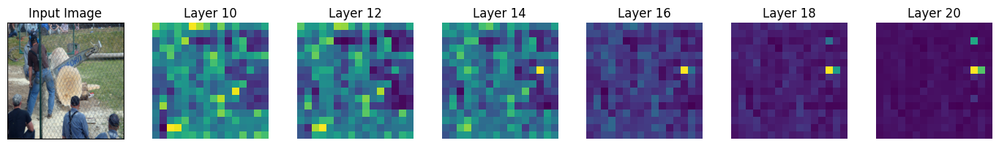

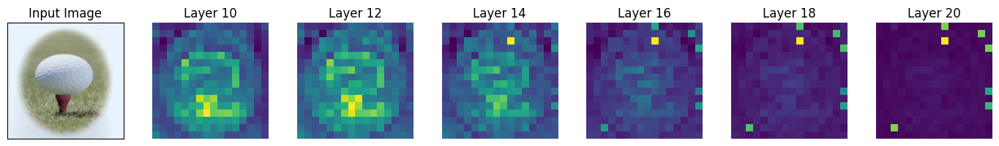

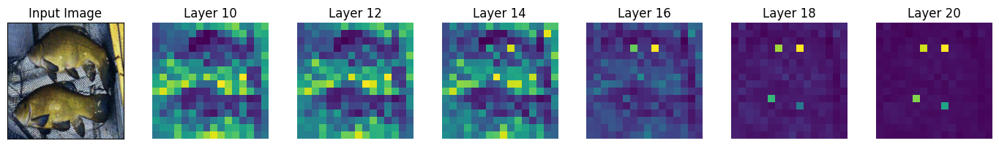

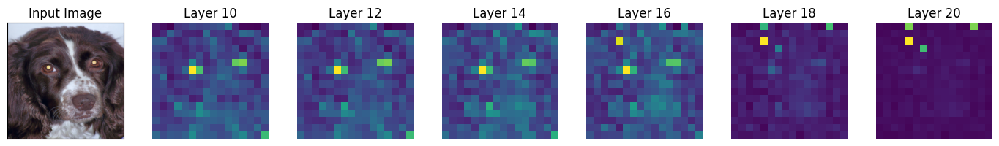

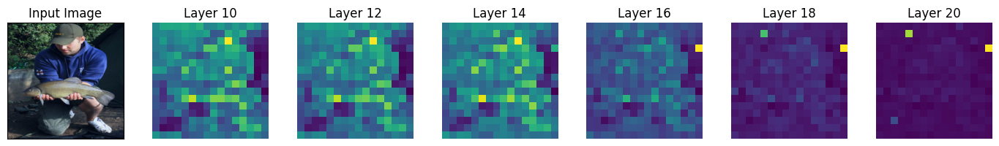

...

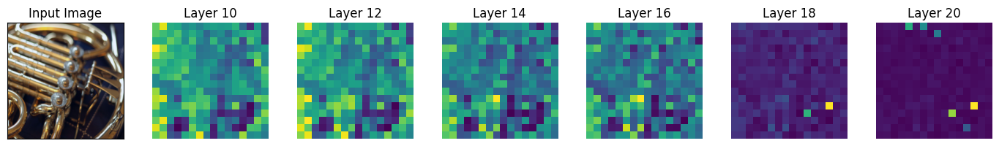

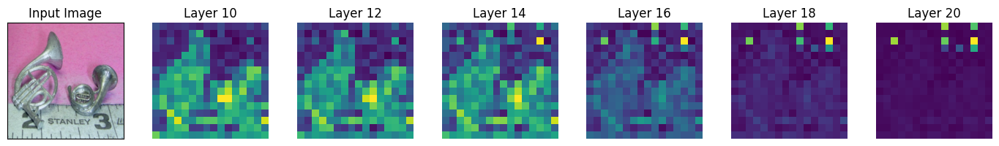

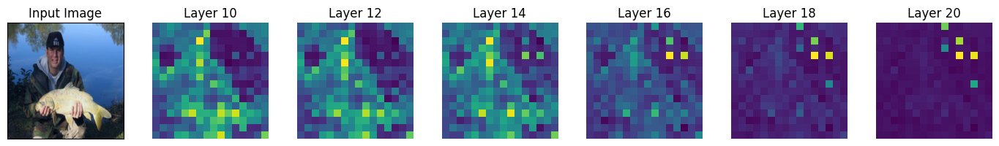

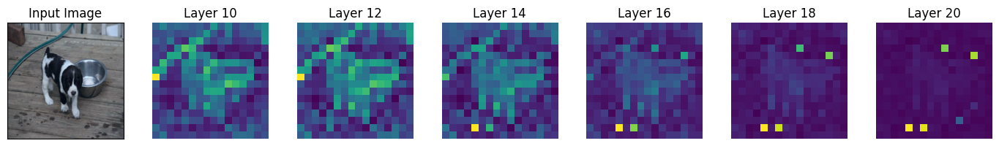

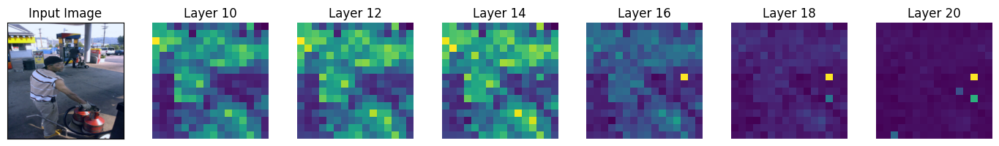

In [ ]:
for i in range(20):
  visualize_emb_att_mlp(dinov2_giant,
                        sample_images[i:i+1],
                        maps_to_visualize=["spatial_embs",],
                        layers_to_visualize=(10, 12, 14, 16, 18, 20),
                        norm_along_layers=False,
                        log_norm=False,
                        )

In [ ]:
dinov2_giant_reg.num_register_tokens

4

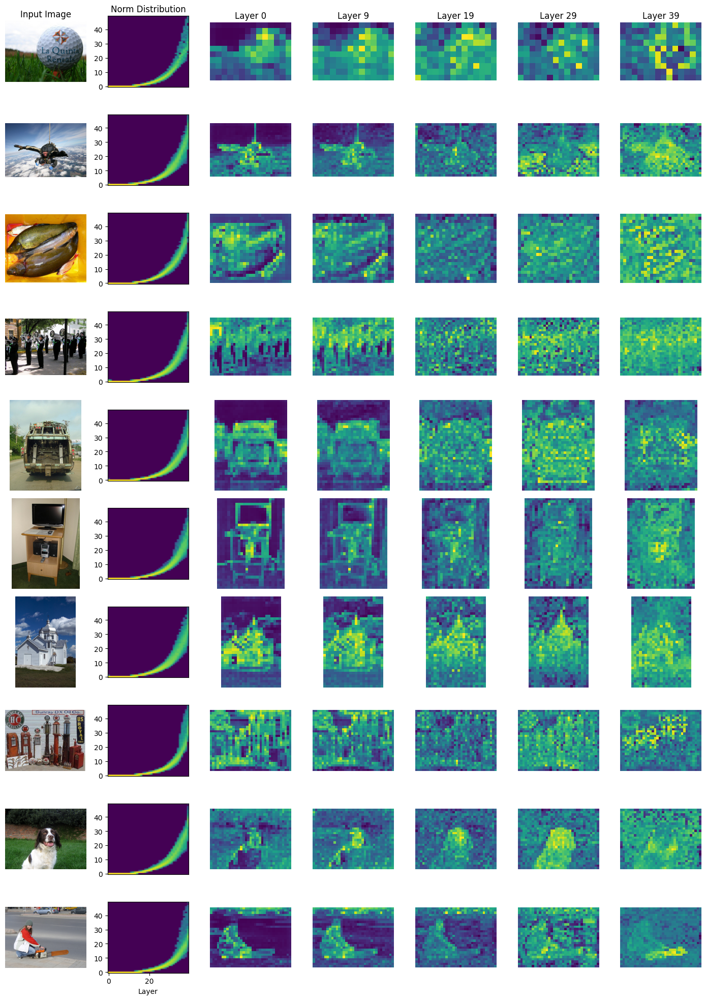

In [ ]:
visualize_normal_maps(dinov2_giant_reg,
                      sample_images[:n_samples],
                      layers_to_visualize=(0, 9, 19, 29, 39),
                      show_norms=True)

For DINOv2 large artifacts appear very suddenly in layer 17. However, looking at the normal curves reveals that the effect is mainly visual

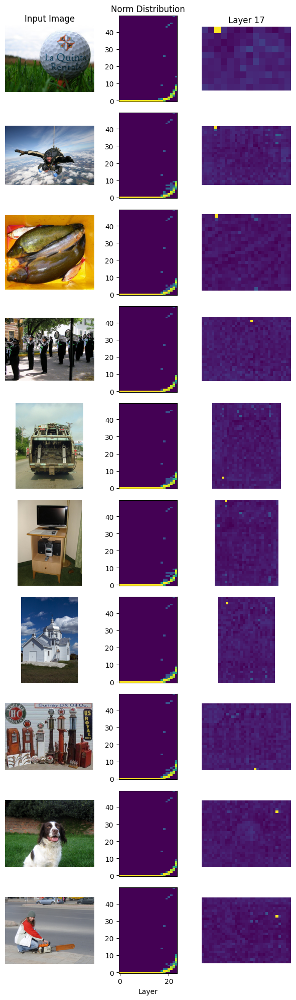

In [ ]:
visualize_normal_maps(dinov2_large,
                      sample_images[:n_samples],
                      layers_to_visualize=[17],
                      show_norms=True)

#### Quantative Analysis

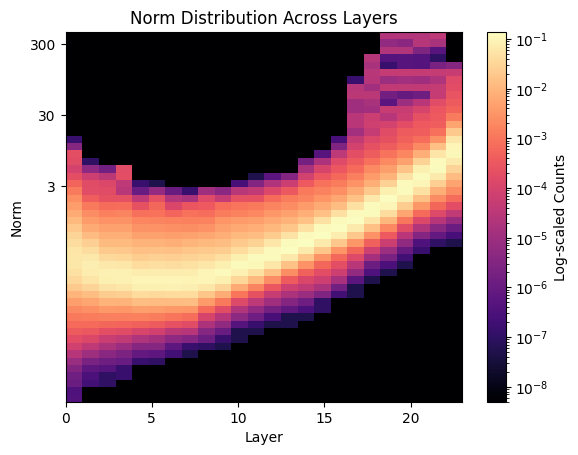

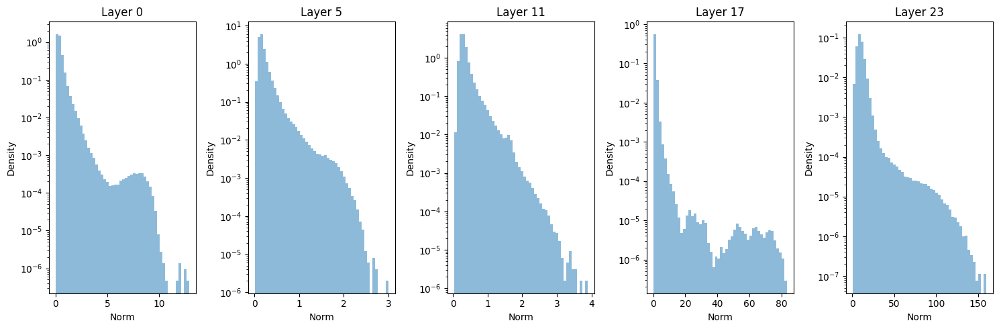

In [ ]:
visualize_average_norms(dinov2_large,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        y_scale="log",
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 11, 17, 23)
                        )

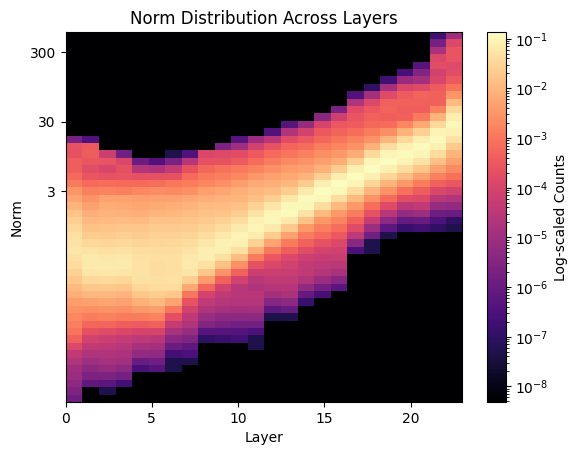

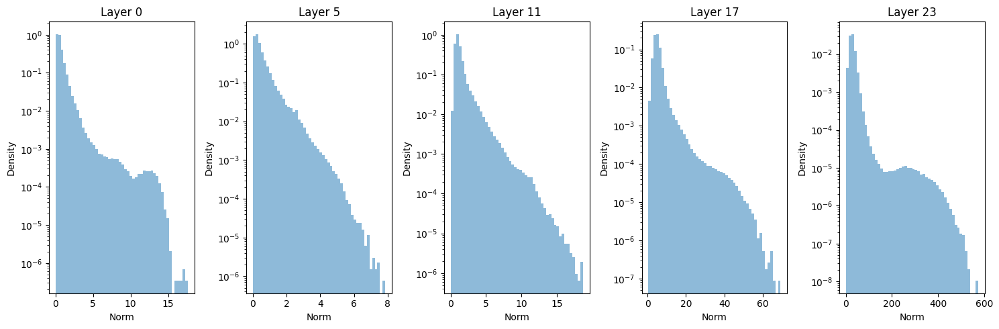

In [ ]:
visualize_average_norms(dinov2_large_reg,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        y_scale="log",
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 11, 17, 23)
                        )

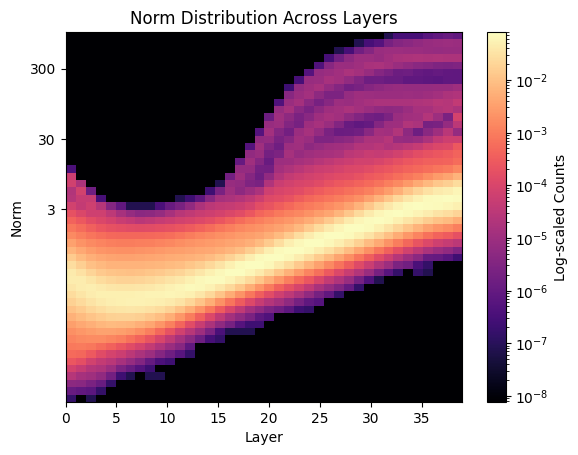

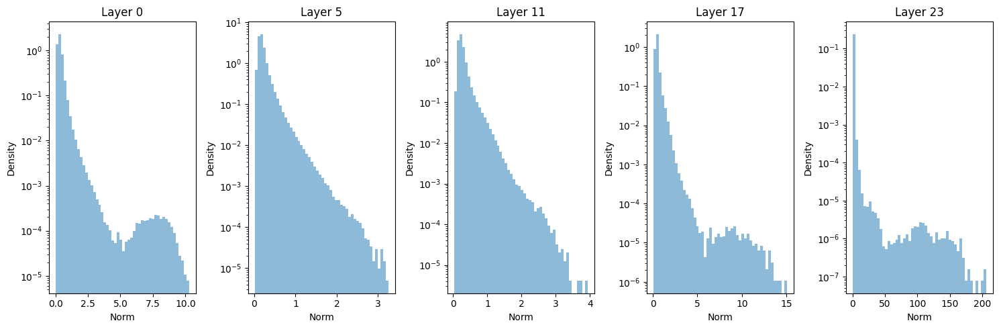

In [ ]:
visualize_average_norms(dinov2_giant,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        y_scale="log",
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 11, 17, 23)
                        )

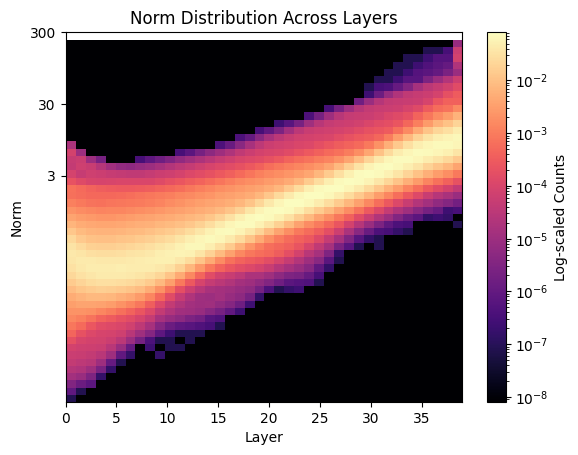

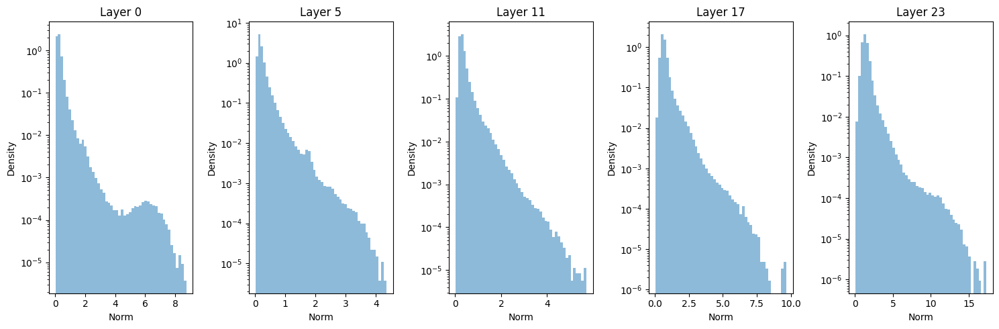

In [ ]:
visualize_average_norms(dinov2_giant_reg,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        y_scale="log",
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 11, 17, 23)
                        )

#### Free up memory

In [ ]:
del dinov2_large

In [ ]:
del dinov2_large_reg

In [ ]:
del dinov2_giant

In [ ]:
del dinov2_giant_reg

In [ ]:
torch.cuda.empty_cache()

<br><br>

---

<br><br>

### DeiT III (pretrained from timm)

Code to load and evaluate DeiT III models using timm.
Visualizes individual images across layers as well as averaged norm curves.


#### pick models to load

In [ ]:
load_modles = "small"  # @param ['small', 'base', 'large', 'all']
trained_on = "fb_in22k_ft_in1k"  # @param ['fb_in1k', 'fb_in22k_ft_in1k']

In [ ]:
# @title DeiT custom forward

def custom_attention_forward(att_module: torch.nn.Module,
                             x: torch.Tensor
                             ) -> Tuple[torch.Tensor, torch.Tensor] | torch.Tensor:

  B, N, C = x.shape
  qkv = att_module.qkv(x).reshape(B, N, 3, att_module.num_heads, att_module.head_dim).permute(2, 0, 3, 1, 4)
  q, k, v = qkv.unbind(0)
  q, k = att_module.q_norm(q), att_module.k_norm(k)

  # x = torch.nn.functional.scaled_dot_product_attention(
  #     q, k, v,
  #     dropout_p=att_module.attn_drop.p if att_module.training else 0.,
  # )

  q = q * att_module.scale
  attn = q @ k.transpose(-2, -1)
  attn = attn.softmax(dim=-1)
  attn = att_module.attn_drop(attn)
  x = attn @ v

  x = x.transpose(1, 2).reshape(B, N, C)
  x = att_module.proj(x)
  x = att_module.proj_drop(x)

  return x, attn

def custom_block_forward(block: timm.models.vision_transformer.Block,
                         x: torch.Tensor
                         ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:

  att_, att = custom_attention_forward(block.attn, block.norm1(x))
  # att has shape 1 (batch), 6 (attention heads), 197 (respective token), 197 (respective tokens attentions to each token, sums to 1);
  # print(att[0, 0, 0].sum())
  # take mean over attention heads
  att = att.mean(dim=1)
  att_ = block.drop_path1(block.ls1(att_))
  # att = block.drop_path1(block.ls1(block.attn(block.norm1(x))))
  x = x + att_
  mlp = block.drop_path2(block.ls2(block.mlp(block.norm2(x))))
  x = x + mlp
  return x, att, mlp

def custom_forward(
            model,
            x: torch.Tensor,
            indices: Optional[Union[int, List[int]]] = None,
            return_prefix_tokens: bool = False,
            stop_early: bool = False,
            output_fmt: str = 'NCHW',
            intermediates_only: bool = False,
            return_att_mlp: bool = False
    ) -> Any:
  """ Forward features that returns intermediates.

  Args:
      x: Input image tensor
      indices: Take last n blocks if int, all if None, select matching indices if sequence
      return_prefix_tokens: Return both prefix and spatial intermediate tokens
      norm: Apply norm layer to all intermediates
      stop_early: Stop iterating over blocks when last desired intermediate hit
      output_fmt: Shape of intermediate feature outputs
      intermediates_only: Only return intermediate features
      return_att_mlp: Return attention and MLP outputs seperately
  Returns:
      List of intermediate features, optionally with attention and MLP outputs
  """
  assert output_fmt in ('NCHW', 'NLC'), 'Output format must be one of NCHW or NLC.'
  reshape = output_fmt == 'NCHW'
  intermediates = []
  spatial_atts = []
  spatial_mlps = []
  take_indices, max_index = feature_take_indices(len(model.blocks), indices)

  # forward pass
  B, _, height, width = x.shape
  x = model.patch_embed(x)
  x = model._pos_embed(x)
  x = model.patch_drop(x)
  x = model.norm_pre(x)

  if torch.jit.is_scripting() or not stop_early:  # can't slice blocks in torchscript
    blocks = model.blocks
  else:
    blocks = model.blocks[:max_index + 1]
  for i, blk in enumerate(blocks):
    x, att, mlp = custom_block_forward(blk, x)
    if i in take_indices:
      # normalize intermediates with final norm layer if enabled
      intermediates.append(x)
      spatial_atts.append(att)
      spatial_mlps.append(mlp)

  # process intermediates
  if model.num_prefix_tokens:
    # split prefix (e.g. class, distill) and spatial feature tokens
    prefix_tokens = [y[:, 0:model.num_prefix_tokens] for y in intermediates]
    intermediates = [y[:, model.num_prefix_tokens:] for y in intermediates]
    prefix_att = [y[:, 0:model.num_prefix_tokens] for y in spatial_atts]
    spatial_atts = [y[:, model.num_prefix_tokens:] for y in spatial_atts]
    prefix_mlp = [y[:, 0:model.num_prefix_tokens] for y in spatial_mlps]
    spatial_mlps = [y[:, model.num_prefix_tokens:] for y in spatial_mlps]

  # reshape to BHWC output format
  H, W = model.patch_embed.dynamic_feat_size((height, width))
  intermediates = [y.reshape(B, H, W, -1).contiguous() for y in intermediates]
  spatial_atts = [y.reshape(B, H, W, -1).contiguous() for y in spatial_atts]
  spatial_mlps = [y.reshape(B, H, W, -1).contiguous() for y in spatial_mlps]
  if return_prefix_tokens:
    prefix_att = [y[:, :, model.num_prefix_tokens:].reshape(B, H, W, -1).contiguous() for y in prefix_att]

  x = model.norm(x)
  out = list()
  if not intermediates_only:
    out.append(x)
  out.append(intermediates)
  if return_att_mlp:
    out.append(spatial_atts)
    out.append(spatial_mlps)
  if model.num_prefix_tokens and return_prefix_tokens:
    out.append(prefix_att)

  return tuple(out)

#### Load Models

In [ ]:
# @title Load Small
deit_small = timm.create_model(f'deit3_small_patch16_224.{trained_on}', pretrained=True)
deit_small.eval();

In [ ]:
# @title Load Base
if load_modles in ["base", "large", "huge"]:
  deit_base = timm.create_model(f'deit3_base_patch16_224.{trained_on}', pretrained=True)
  deit_base.eval();
else:
  deit_base = None

In [ ]:
# @title Load Large
if load_modles in ["large", "huge"]:
  deit_large = timm.create_model(f'deit3_large_patch16_224.{trained_on}', pretrained=True)
  deit_large.eval();
else:
  deit_large = None

In [ ]:
# @title Load Huge
if load_modles == "huge":
  deit_huge = timm.create_model(f'deit3_huge_patch16_224.{trained_on}', pretrained=True)
  deit_huge.eval();
else:
  deit_huge = None

In [ ]:
# @title Print Model Info
print(len(deit_small.blocks))
print(len(deit_base.blocks)) if deit_base else None
print(len(deit_large.blocks)) if deit_large else None
print(len(deit_huge.blocks)) if deit_huge else None
print(deit_small.patch_embed.num_patches)
print(deit_base.patch_embed.num_patches) if deit_base else None
print(deit_large.patch_embed.num_patches) if deit_large else None
print(deit_huge.patch_embed.num_patches) if deit_huge else None

12
12
196
196


#### Qualitative Analysis

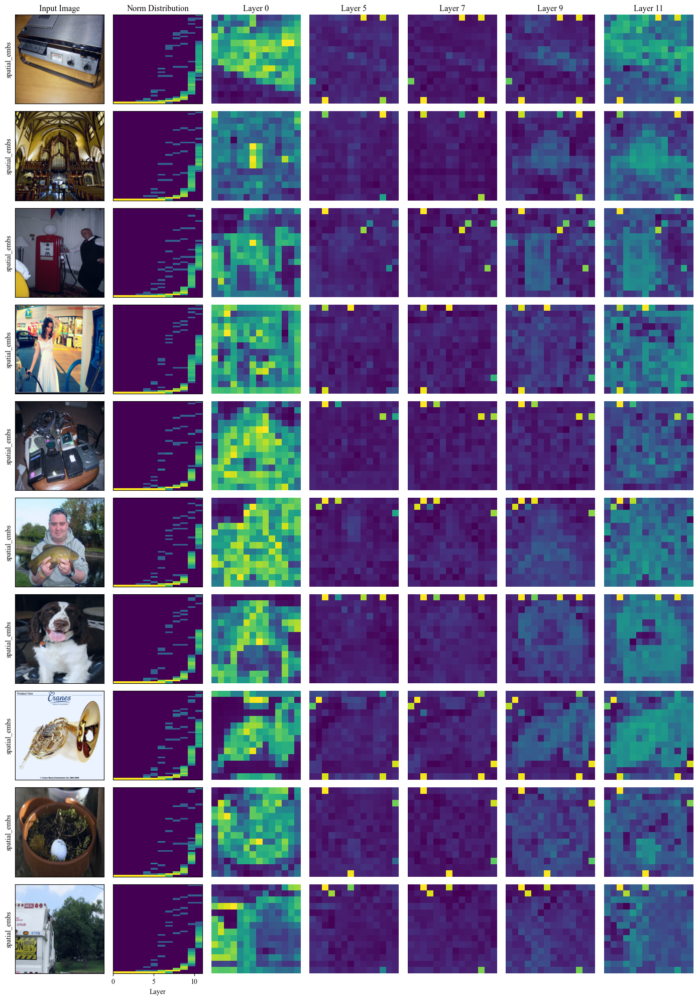

In [ ]:
visualize_emb_att_mlp(model=deit_small,
                      images=sample,
                      layers_to_visualize=(0, 5, 7, 9, 11),
                      maps_to_visualize=["spatial_embs",],
                      size=(224, 224),
                      show_norms=True,
)

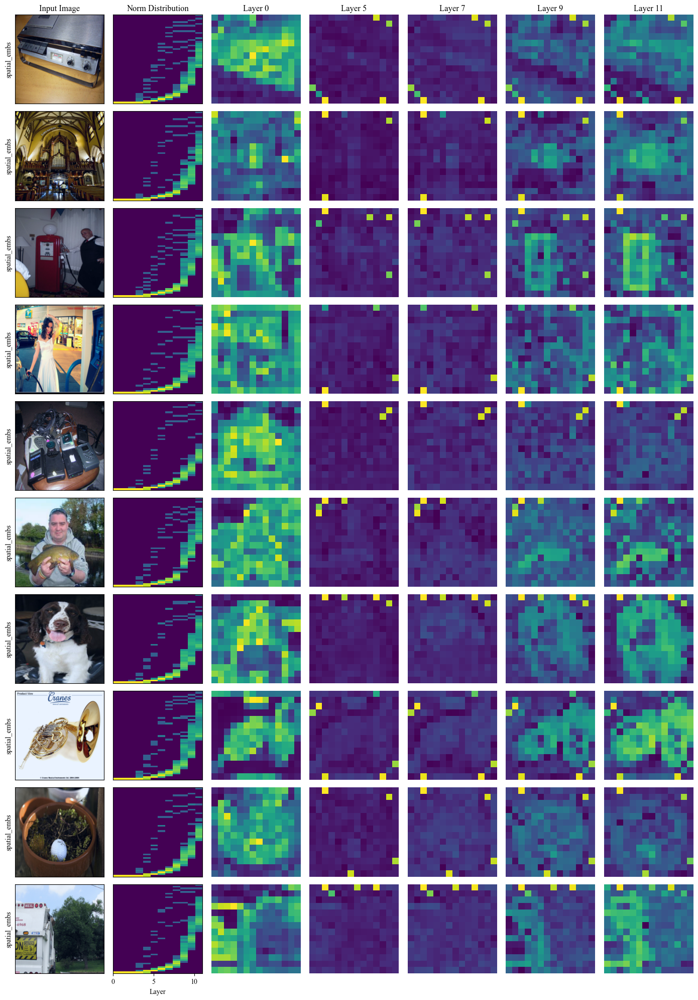

In [ ]:
visualize_emb_att_mlp(model=deit_base,
                      images=sample,
                      layers_to_visualize=(0, 5, 7, 9, 11),
                      size=(224, 224),
                      maps_to_visualize=["spatial_embs",],
                      show_norms=True,
)

In [ ]:
visualize_emb_att_mlp(model=deit_large,
                      images=sample,
                      layers_to_visualize=(0, 6, 15, 19, 23),
                      maps_to_visualize=["spatial_embs",],
                      size=(224, 224),
                      show_norms=True,
)

In [ ]:
visualize_emb_att_mlp(model=deit_huge,
                      images=sample_images,
                      layers_to_visualize=(0, 6, 15, 19, 23),
                      maps_to_visualize=["spatial_embs",],
                      size=(224, 224),
                      show_norms=True,
)


#### Quantitative Analysis

In [ ]:
n_batches = 8




spatial_embs


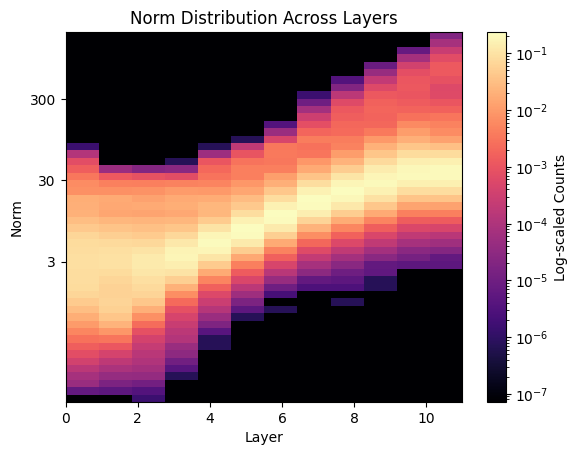

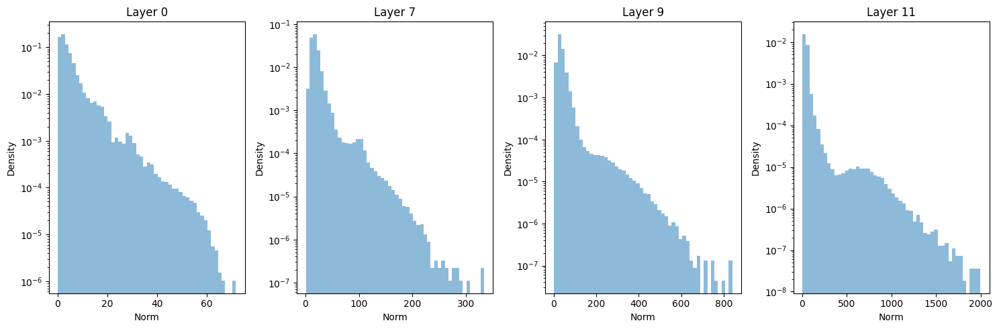

In [ ]:
visualize_average_norms(model=deit_small,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        layers_total=12,
                        y_scale="log",
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 7, 9, 11),
                        norm_scale="log",
                        density_scale="log",
                        )




spatial_embs


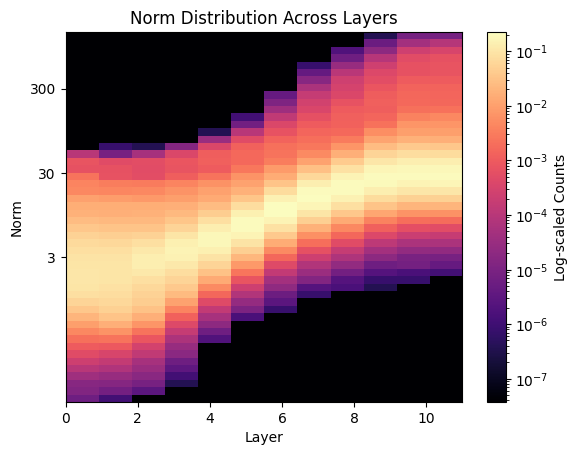

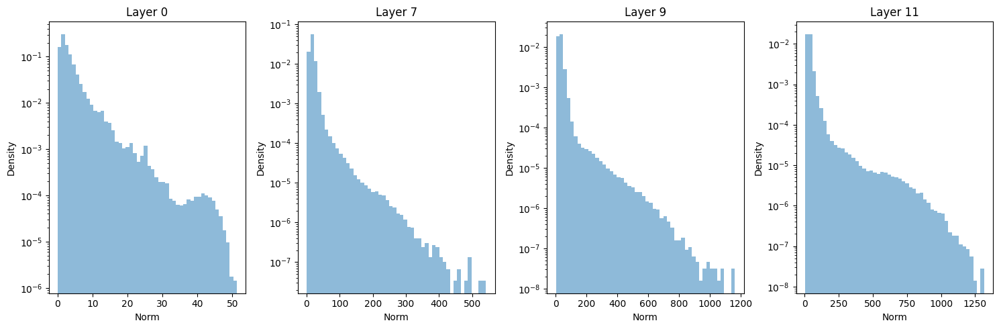

In [ ]:
visualize_average_norms(model=deit_base,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        layers_total=12,
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 7, 9, 11),
                        norm_scale="log",
                        density_scale="log",
                        )

In [ ]:
visualize_average_norms(model=deit_large,
                        data_loader=data_loader,
                        n_batches=n_batches,
                        layers_total=12,
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 7, 9, 11)
                        )

In [ ]:
visualize_average_norms(model=deit_huge,
                        image_batches=data_loader,
                        layers_total=12,
                        size=(224, 224),
                        by_layer=True,
                        layers_to_visualize=(0, 7, 9, 11)
                        )

<br><br>

---

<br><br>

### DeiT III (Ours)

Code to load and evaluate checkpoints of our DeiTII models with and without registers, requires access to checkpoint files.
Visualizes individual images across layers as well as averaged norm curves.

In [ ]:
checkpoint_name = "checkpoint799.pth"

deit_source = load_models_from_drive(checkpoint_name, registers=False)
deit_register = load_models_from_drive(checkpoint_name, registers=True)


<ipython-input-14-875f458ee796>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODELS_PATH[path] + "/" + checkpoint_name,


#### Qualitative Analysis (Visualization of individual images)

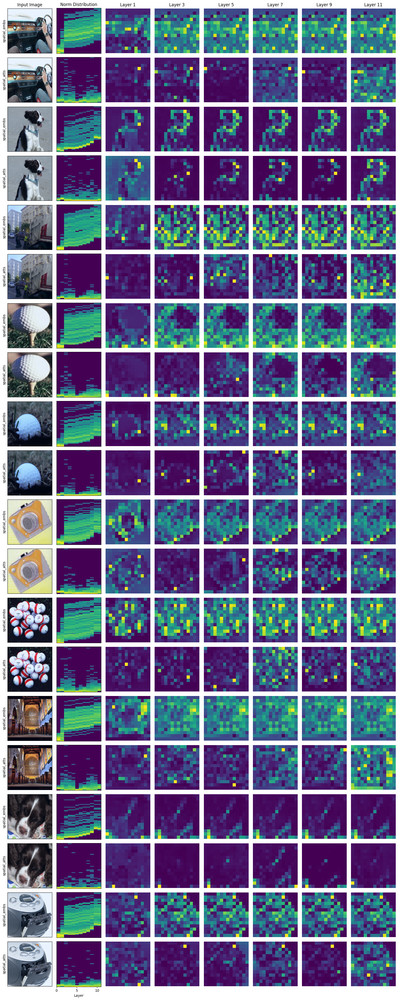

In [ ]:
visualize_emb_att_mlp(model=deit_source,
                      images=sample,
                      layers_to_visualize=(1, 3, 5, 7, 9, 11),
                      maps_to_visualize=[
                          "spatial_embs",
                          "spatial_atts",
                      ],
                      log_norm=False
                      )

In [ ]:
visualize_emb_att_mlp(model=deit_register,
                      images=sample,
                      layers_to_visualize=(0, 5, 7, 9, 11),
                      maps_to_visualize=[
                          "spatial_embs",
                          "spatial_atts",
                      ],
                      size=(224, 224),
                      show_norms=True,
                      )

In [ ]:
visualize_emb_att_mlp(model=deit_register,
                      images=sample,
                      layers_to_visualize=[11,],
                      maps_to_visualize=[
                          "prefix_atts",
                      ],
                      size=(224, 224),
                      show_norms=True,
                      )

In [ ]:
deit_register = load_models_from_drive("checkpoint399.pth", registers=True)
visualize_emb_att_mlp(model=deit_register,
                      images=sample[:5],
                      layers_to_visualize=[11,],
                      maps_to_visualize=[
                          "prefix_atts",
                      ],
                      size=(224, 224),
                      show_norms=True,
                      )

In [ ]:
deit_register = load_models_from_drive("checkpoint19.pth", registers=True)
visualize_emb_att_mlp(model=deit_register,
                      images=sample[:5],
                      layers_to_visualize=[11,],
                      maps_to_visualize=[
                          "prefix_atts",
                      ],
                      size=(224, 224),
                      show_norms=True,
                      )

#### Quantitative Analysis

In [ ]:
visualize_average_norms(deit_source,
                        data_loader=data_loader,
                        n_batches=len(data_loader),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 7, 9, 11),
                        maps_to_visualize=["spatial_embs", "spatial_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )


In [ ]:
visualize_average_norms(deit_register,
                        data_loader=data_loader,
                        n_batches=len(data_loader),
                        by_layer=True,
                        layers_to_visualize=(0, 5, 7, 9, 11),
                        maps_to_visualize=["spatial_embs", "spatial_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )


In [ ]:
visualize_average_norms(deit_register,
                        data_loader=data_loader,
                        n_batches=len(data_loader),
                        by_layer=True,
                        layers_to_visualize=[11],
                        maps_to_visualize=["prefix_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )

In [ ]:
visualize_average_norms(deit_register,
                        data_loader=data_loader_CIFAR10,
                        n_batches=len(data_loader_CIFAR10),
                        by_layer=True,
                        layers_to_visualize=[11],
                        maps_to_visualize=["prefix_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )

In [ ]:
visualize_average_norms(deit_register,
                        data_loader=data_loader_Caltech101,
                        n_batches=len(data_loader_Caltech101),
                        by_layer=True,
                        layers_to_visualize=[11],
                        maps_to_visualize=["prefix_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )

In [ ]:
visualize_average_norms(deit_register,
                        data_loader=data_loader_Flowers102,
                        n_batches=len(data_loader_Flowers102),
                        by_layer=True,
                        layers_to_visualize=[11],
                        maps_to_visualize=["prefix_atts"],
                        size=(224, 224),
                        density_scale="log",
                       )

<br><br>

---

<br><br>

### Experiment: Norms along iterations

Visualize Norm Distributions across training Epochs.
This experiment requires checkpoints every couple of training iterations.
Some properties of the plots (like log scaling) can be customized.

In [ ]:
# @title Visualize Norm Distributions for multiple model checkpoints
def visualize_along_iterations(checkpoints,
                               data_loader,
                               registers: bool,
                               maps_to_visualize: Sequence[str],
                               layers_to_visualize: Sequence[int],
                               layers_total: int,
                               n_batches: int = 32,
                               model_batch_size: int = 1,  # Number of models to evaluate simultaneously
                               **kwargs):

  for m in maps_to_visualize:
    if m not in VALID_MAPS:
      raise ValueError(f"maps_to_visualize must be one of {VALID_MAPS}")
    if m.startswith("prefix"):
      raise ValueError("Prefix token maps not supported yet")

  assert all([checkpoint_name in os.listdir(MODELS_PATH["registers" if registers else "source"])
    for checkpoint_name in checkpoints])

  truncate_norms = kwargs.get("truncate_norms", None)
  norm_scale = kwargs.get("norm_scale", "log")
  norms_dict = {map: [[[] for _ in checkpoints]
                  for _ in layers_to_visualize]
                for map in maps_to_visualize}

  # Process models in batches
  for model_start_idx in range(0, len(checkpoints), model_batch_size):
    model_end_idx = min(model_start_idx + model_batch_size, len(checkpoints))
    model_batch = checkpoints[model_start_idx:model_end_idx]

    # Load a subset of models
    models = [load_models_from_drive(cp, registers=registers).to(device) for cp in model_batch]

    # Evaluate models over multiple batches
    for n, (images, _) in enumerate(data_loader):
      if n == n_batches:
        break
      images = images.to(device)

      for n_cp, model in enumerate(models):
        output = get_all_intermediates(model, images, layers_total)

        for map in maps_to_visualize:
          for n_layer, layer in enumerate(layers_to_visualize):

            norms = output[map][layer]

            if map == "spatial_atts":
              norms = norms.squeeze().mean(axis=(0, 1)).flatten()
            else:
              norms = np.linalg.norm(norms, axis=2).flatten()
              if truncate_norms:
                norms = np.clip(norms, 0, truncate_norms)

            # Store results in the correct position in norms_dict
            norms_dict[map][n_layer][model_start_idx + n_cp].extend(norms)

        del output
        torch.cuda.empty_cache()

    # Clean up models to free memory
    del models
    torch.cuda.empty_cache()

  # Visualize the results
  for map in maps_to_visualize:
    for n_layer, layer in enumerate(layers_to_visualize):
      print("\n\n\nVisualizing " + map)
      # convert lists to np
      norms_array = np.array(norms_dict[map][n_layer])
      cp_array = np.indices(norms_array.shape)[0].flatten()
      norms_array = norms_array.flatten()

      if norm_scale == "log" and map == "spatial_embs":
        norms_array_scaled = np.log10(norms_array + 1e-8)
      else:
        norms_array_scaled = norms_array

      heatmap, xedges, yedges = np.histogram2d(cp_array, norms_array_scaled,
                                                  density=True,
                                                  bins=[len(checkpoints), 200])

      heatmap = np.maximum(heatmap, kwargs.get("min_density", 1e-3))

      xmax_extend = kwargs.get("max_iter", 100)

      plt.imshow(heatmap.T,
                aspect="auto",
                extent=(0, xmax_extend, yedges[0], yedges[-1]),
                interpolation='none',
                zorder=0,
                cmap='magma',
                origin='lower',
                norm=LogNorm(vmin=heatmap.min(), vmax=heatmap.max())
                )

      title = "Norm" if map == "spatial_embs" else "Attention"

      plt.colorbar(label='Proportion')
      plt.xlabel('Train iter')
      plt.ylabel(title)
      if norm_scale == "log" and map == "spatial_embs":
        plt.yticks(np.log10([3, 30, 300]), labels=["3", "30", "300"])
      plt.title(f'{title} along iteration')
      plt.show()

['checkpoint19.pth', 'checkpoint39.pth', 'checkpoint59.pth', 'checkpoint79.pth', 'checkpoint99.pth', 'checkpoint119.pth', 'checkpoint139.pth', 'checkpoint159.pth', 'checkpoint179.pth', 'checkpoint199.pth', 'checkpoint219.pth', 'checkpoint239.pth', 'checkpoint259.pth', 'checkpoint279.pth', 'checkpoint299.pth', 'checkpoint319.pth', 'checkpoint339.pth', 'checkpoint359.pth', 'checkpoint379.pth', 'checkpoint399.pth', 'checkpoint419.pth', 'checkpoint439.pth', 'checkpoint459.pth', 'checkpoint479.pth', 'checkpoint499.pth', 'checkpoint519.pth', 'checkpoint539.pth', 'checkpoint559.pth', 'checkpoint579.pth', 'checkpoint599.pth', 'checkpoint619.pth', 'checkpoint639.pth', 'checkpoint659.pth', 'checkpoint679.pth', 'checkpoint699.pth', 'checkpoint719.pth', 'checkpoint739.pth', 'checkpoint759.pth', 'checkpoint779.pth', 'checkpoint799.pth']


<ipython-input-14-875f458ee796>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODELS_PATH[path] + "/" + checkpoint_name,





Visualizing spatial_embs


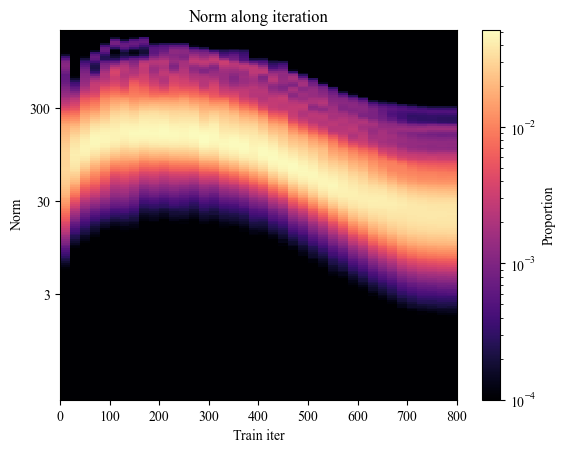




Visualizing spatial_atts


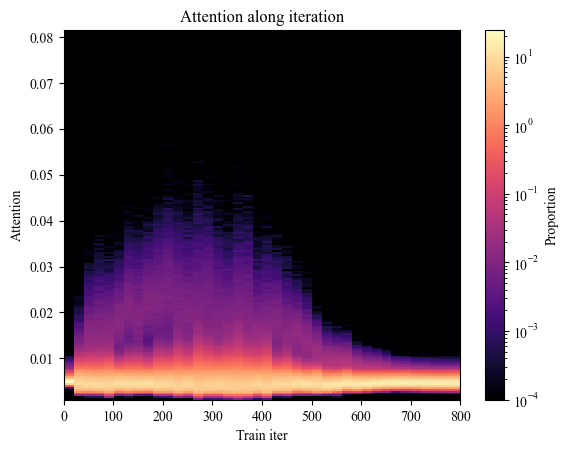

In [ ]:
checkpoints = [f"checkpoint{a}.pth" for a in range(19, 800, 20)]

print(checkpoints)

visualize_along_iterations(checkpoints=checkpoints,
                           data_loader=data_loader,
                           registers=False,
                           layers_to_visualize=[11],
                           maps_to_visualize=["spatial_embs", "spatial_atts"],
                           layers_total=12,
                           n_batches=32,
                           model_batch_size=10,
                           max_iter=800,
                           min_density=1e-4,
)

<ipython-input-14-875f458ee796>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODELS_PATH[path] + "/" + checkpoint_name,





Visualizing spatial_embs


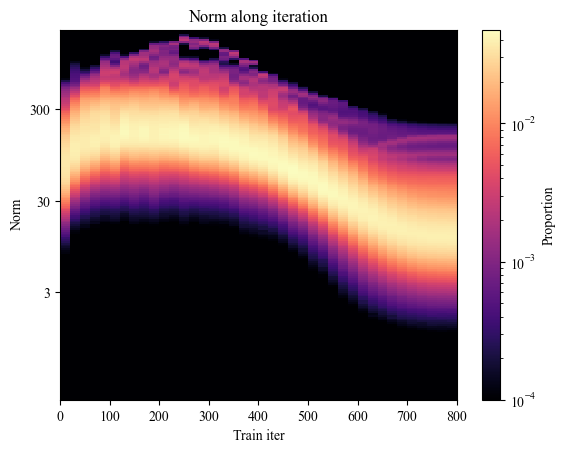




Visualizing spatial_atts


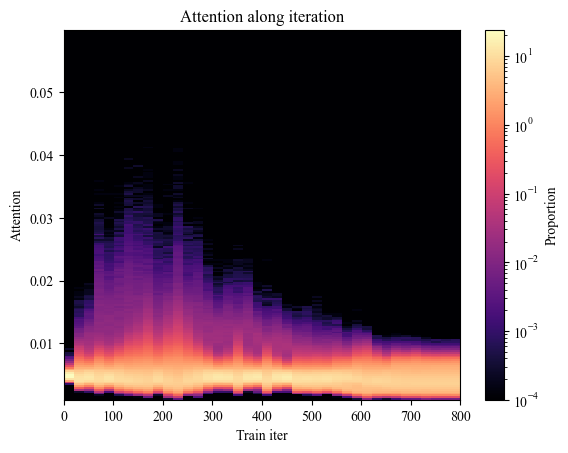

In [ ]:
visualize_along_iterations(checkpoints=checkpoints,
                           data_loader=data_loader,
                           registers=True,
                           layers_to_visualize=[11],
                           maps_to_visualize=["spatial_embs","spatial_atts"],
                           layers_total=12,
                           n_batches=32,
                           model_batch_size=10,
                           max_iter=800,
                           min_density=1e-4,
)

<br><br>

---

<br><br>

### Experiment: Global information in low and high norm tokens

To evaluate how much global information is held in each individual token, predict the global class from individual tokens.

Like in Vision tranformers Need Registers, we use Logistic Regressors as a simple classification method.
To ensure that the training data is evenly weighted, the method choose one high norm token (l2 norm > 150) and one normal one (< 150) per sample image.
Optionally, prefix tokens can be added into the comparison

In [ ]:
# @title evaluate class by patch

def _get_token_subset(model,
                     data_loader,
                     layer_to_evaluate: int,
                     n_batches: int,
                     layers_total: int,
                     select_by: str = "norm", # norm or attention
                     prefix: str = "CLS", # none, CLS or all
                     threshold: float | str = "auto",
                     debug=False,
                     ):

  x = defaultdict(list)
  y = []
  norm_means = []

  for i, (input_tensor, labels) in tqdm(enumerate(data_loader), total=n_batches):
    if i == n_batches:
      break

    input_tensor = input_tensor.to(device)
    intermediates = get_all_intermediates(model, input_tensor, layers_total, )  # Extract embeddings

    token_embeddings = intermediates["spatial_embs"][layer_to_evaluate]
    # token_embeddings shape is [batch, height, width, embedding_dim]

    # flatten height and width into single axis
    token_embeddings = token_embeddings.reshape(token_embeddings.shape[0], -1, token_embeddings.shape[-1])
    token_norms = np.linalg.norm(token_embeddings, axis=-1)  # [batch, num_tokens]
    print(token_norms.shape) if debug and i == 0 else None

    if select_by == "attention":
      token_attention = intermediates["spatial_atts"][layer_to_evaluate]  # [batch, num_heads, num_tokens, num_tokens]
      token_attention = token_attention.mean(axis=(1,2))
      print(token_attention.shape) if debug and i == 0 else None
      token_norms = token_attention

    if prefix != "none":
      prefix_token_embeddings = intermediates["prefix_embs"][layer_to_evaluate]
      print(prefix_token_embeddings.shape) if debug and i == 0 else None

    for img_idx in range(token_embeddings.shape[0]):  # Iterate over the batch
      norms = token_norms[img_idx]
      tokens = token_embeddings[img_idx]

      # divide high norm and low norm
      norm_means.append(np.quantile(norms, 0.98))
      threshold_ = norm_means[-1] if threshold == "auto" else threshold
      high_norm_indices = np.where(norms > threshold_)[0]
      low_norm_indices = np.where(norms < threshold_)[0]

      # skip image if no outliers are present
      if len(high_norm_indices) == 0 or len(low_norm_indices) == 0:
        continue

      # Select one random token from each category for training data
      high_norm_idx = high_norm_indices[np.random.randint(0, len(high_norm_indices), (1,))].item()
      high_norm_token = tokens[high_norm_idx]
      x["high"].append(high_norm_token)

      low_norm_idx = low_norm_indices[np.random.randint(0, len(low_norm_indices), (1,))].item()
      low_norm_token = tokens[low_norm_idx]
      x["low"].append(low_norm_token)

      # add CLS to training data
      if prefix != "none":
        x["CLS"].append(prefix_token_embeddings[img_idx, 0])
        if prefix == "all":
          for prefix_idx in range(1, prefix_token_embeddings.shape[1]):
            x[f"REG{prefix_idx-1}"].append(prefix_token_embeddings[img_idx, prefix_idx])

      y.append(labels[img_idx])

    del input_tensor, intermediates
    torch.cuda.empty_cache()

  y = np.array(y)
  return x, y, norm_means



def evaluate_class_by_patch(
    model,
    data_loader,
    layer_to_evaluate: int = 11,
    layers_total: int = 12,
    threshold: float | str = "auto",
    normalize_tokens: bool = True,
    prefix: str = "CLS",  # none, CLS or all
    common_lr: bool = False,
    train_batches: int | bool = 8,
    resample_test: bool = False,
    test_batches: int | bool = 8,
    debug=False,
    **kwargs,
  ):
    """
    Evaluate class prediction accuracy by patch embeddings from a ViT using Logistic Regression.

    Args:
        model: The Vision Transformer (ViT) model.
        data_loader: DataLoader containing the input dataset.
      layer_to_evaluate: The attention block layer from which to select
        token embeddings.
      layers_total: Total number of layers in the model.
      threshold: decides whether a patch is high or low norm,
        auto uses batch statistics to select 98th percentile
      normalize_tokens: if True use StandardScaler to scale features
      prefix: determines what prefix tokens to evaluate, valid choices are
        "none", "CLS" or "all"
      common_lr: if True, trains all token conditions on the same regressor
      train_batches: number of batches to train on
      resample_test: if True, samples new tokens for evaluation, otherwise use
        training tokens
      test_batchs: number of batches to evaluate on, only relevant when resample_test is True
      debug: if True, print debug information

    Returns:
        None (displays a table and scatterplot of accuracy vs token norm).
    """

    x_train = defaultdict(list)
    scaler = dict()
    y_train = []
    norm_means = []

    model.to(device)

    print(f"Collecting random training samples")

    # Training Phase
    x_train, y_train, norm_means = _get_token_subset(
        model=model,
        data_loader=data_loader,
        layer_to_evaluate=layer_to_evaluate,
        n_batches=train_batches,
        layers_total=layers_total,
        prefix=prefix,
        threshold=threshold,
        debug=debug,
    )

    print(f"Training on {len(y_train)} samples...")
    norm_means = np.array(norm_means)
    threshold_ = norm_means.mean() if threshold == "auto" else threshold
    y_train = np.array(y_train)

    if common_lr:
        lr = LogisticRegression(max_iter=kwargs.get("max_iter", 10000))
        X_train = list()
        for k in x_train.keys():
            # Scale each category by themselves
            if normalize_tokens:
                scaler[k] = StandardScaler().fit(x_train[k])
                x_train[k] = scaler[k].transform(x_train[k])
            X_train.extend(x_train[k])
        X_train = np.array(X_train)
        y_train_repeated = np.repeat(y_train, len(x_train.keys()))
        lr.fit(X_train, y_train_repeated)
    else:
        lrs = {
            k: LogisticRegression(max_iter=kwargs.get("max_iter", 10000))
            for k in x_train.keys()
        }

        for k in lrs.keys():
            X_train = np.array(x_train[k])

            if normalize_tokens:
                scaler[k] = StandardScaler().fit(X_train)
                X_scaled = scaler[k].transform(X_train)
            else:
                X_scaled = X_train

            lrs[k].fit(X_scaled, y_train)

    if resample_test:
        del x_train, y_train
        print(f"Collecting evaluation samples")
        # Evaluation Phase

        eval_tokens, true_labels, _ = _get_token_subset(
            model=model,
            data_loader=data_loader,
            layer_to_evaluate=layer_to_evaluate,
            n_batches=test_batches,
            layers_total=layers_total,
            prefix=prefix,
            threshold=threshold_,
            debug=debug,
        )
    else:
        eval_tokens = x_train
        true_labels = y_train

    model.to("cpu")
    print(f"Evaluating on {len(true_labels)} samples...")
    eval_preds = defaultdict(list)
    eval_acc = dict()

    # Predict for each category
    for k in eval_tokens.keys():
        x = np.array(eval_tokens[k])

        if normalize_tokens:
            x = scaler[k].transform(x)

        prediction = lr.predict(x) if common_lr else lrs[k].predict(x)
        eval_preds[k].extend(prediction)
        eval_acc[k] = accuracy_score(true_labels, prediction)
    print("Finished\n\n")

    # Generate a Table
    table_data = [
        ["Token Norm Range", "Accuracy"],
        [f"High Norm Tokens (>{threshold_:.2f})", f"{eval_acc['high']:.4f}"],
        [f"Low Norm Tokens (<{threshold_:.2f})", f"{eval_acc['low']:.4f}"],
    ]
    if prefix != "none":
        table_data.append([f"CLS Tokens", f"{eval_acc['CLS']:.4f}"])
    if prefix == "all":
        table_data.extend(
            [[reg, f"{eval_acc[reg]:.4f}"] for reg in eval_acc.keys() if reg.startswith("REG")]
        )

    for row in table_data:
        print("{:<30} {:<10}".format(*row))

    if debug:
        # Print class distribution
        print("\n")
        for y in set(true_labels.tolist()):
            print(f"{y}: {np.mean(true_labels == y)}")


In [ ]:
model_no_reg = load_models_from_drive("checkpoint799.pth", registers=False)
model_reg = load_models_from_drive("checkpoint799.pth", registers=True)

<ipython-input-13-875f458ee796>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODELS_PATH[path] + "/" + checkpoint_name,


In [ ]:
evaluate_class_by_patch(model=model_no_reg,
                        data_loader=data_loader,
                        threshold="auto",
                        train_batches=80,
                        prefix = "CLS",
                        )

  0%|          | 0/80 [00:00<?, ?it/s]

Training on 2560 samples...
Evaluating on 2560 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>260.16)     0.7098    
Low Norm Tokens (<260.16)      0.7434    
CLS Tokens                     0.8254    


In [ ]:
evaluate_class_by_patch(model=model_reg,
                        data_loader=data_loader,
                        threshold=180,
                        prefix="all",
                        train_batches=len(data_loader),
                        normalize_tokens=True
                        )

  0%|          | 0/296 [00:00<?, ?it/s]

Training on 8948 samples...
Evaluating on 8948 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.7142    
Low Norm Tokens (<180.00)      0.6579    
CLS Tokens                     0.7167    
REG0                           0.6902    
REG1                           0.7273    
REG2                           0.7395    
REG3                           0.7359    


In [ ]:
for dl in [data_loader_Caltech101, data_loader_Flowers102, data_loader_CIFAR10]:
  evaluate_class_by_patch(model=model_no_reg,
                          data_loader=dl,
                          threshold=180,
                          train_batches=min(len(dl), 512)
                          )
  evaluate_class_by_patch(model=model_reg,
                          data_loader=dl,
                          threshold=180,
                          prefix="all",
                          train_batches=min(len(dl), 512)
                          )

  Token Norm Range               Accuracy
High Norm Tokens (>180.00)     0.3902
Low Norm Tokens (<180.00)      0.4307
CLS Tokens                     0.5812
REG0                           0.5142
REG1                           0.5967
REG2                           0.5894
REG3                           0.6078

  0%|          | 0/136 [00:00<?, ?it/s]

Training on 8603 samples...
Evaluating on 8603 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.3902    
Low Norm Tokens (<180.00)      0.4736    
CLS Tokens                     0.4521    


  0%|          | 0/136 [00:00<?, ?it/s]

Training on 8019 samples...
Evaluating on 8019 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.3902    
Low Norm Tokens (<180.00)      0.4307    
CLS Tokens                     0.5812    
REG0                           0.5142    
REG1                           0.5967    
REG2                           0.5894    
REG3                           0.6078    


  0%|          | 0/16 [00:00<?, ?it/s]

Training on 1016 samples...
Evaluating on 1016 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.8159    
Low Norm Tokens (<180.00)      0.7697    
CLS Tokens                     0.5443    


  0%|          | 0/16 [00:00<?, ?it/s]

Training on 984 samples...
Evaluating on 984 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.8161    
Low Norm Tokens (<180.00)      0.6148    
CLS Tokens                     0.5467    
REG0                           0.5701    
REG1                           0.5874    
REG2                           0.5793    
REG3                           0.5335    


  0%|          | 0/512 [00:00<?, ?it/s]

Training on 7965 samples...
Evaluating on 7965 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.5784    
Low Norm Tokens (<180.00)      0.6192    
CLS Tokens                     0.6306    


  0%|          | 0/512 [00:00<?, ?it/s]

Training on 1223 samples...
Evaluating on 1223 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>180.00)     0.5151    
Low Norm Tokens (<180.00)      0.5487    
CLS Tokens                     0.6304    
REG0                           0.6492    
REG1                           0.6386    
REG2                           0.6468    
REG3                           0.6271    


In [ ]:
for dl in [data_loader, data_loader_Caltech101, data_loader_Flowers102, data_loader_CIFAR10]:
  evaluate_class_by_patch(model=model_no_reg,
                          data_loader=dl,
                          threshold=150,
                          train_batches=len(dl)
                          )
  evaluate_class_by_patch(model=model_reg,
                          data_loader=dl,
                          threshold=150,
                          prefix="all",
                          train_batches=len(dl)
                          )


  0%|          | 0/296 [00:00<?, ?it/s]

Training on 8892 samples...
Evaluating on 8892 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.7170    
Low Norm Tokens (<150.00)      0.7417    
CLS Tokens                     0.6736    


  0%|          | 0/296 [00:00<?, ?it/s]

Training on 9343 samples...
Evaluating on 9343 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.7107    
Low Norm Tokens (<150.00)      0.6730    
CLS Tokens                     0.7211    
REG0                           0.6927    
REG1                           0.7294    
REG2                           0.7418    
REG3                           0.7384    


  0%|          | 0/136 [00:00<?, ?it/s]

Training on 8287 samples...
Evaluating on 8287 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.3810    
Low Norm Tokens (<150.00)      0.5034    
CLS Tokens                     0.4537    


  0%|          | 0/136 [00:00<?, ?it/s]

Training on 8555 samples...
Evaluating on 8555 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.3912    
Low Norm Tokens (<150.00)      0.4674    
CLS Tokens                     0.5840    
REG0                           0.5158    
REG1                           0.5992    
REG2                           0.5892    
REG3                           0.6131    


  0%|          | 0/16 [00:00<?, ?it/s]

Training on 929 samples...
Evaluating on 929 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.7287    
Low Norm Tokens (<150.00)      0.8644    
CLS Tokens                     0.5145    


  0%|          | 0/16 [00:00<?, ?it/s]

Training on 1015 samples...
Evaluating on 1015 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.8236    
Low Norm Tokens (<150.00)      0.6453    
CLS Tokens                     0.5507    
REG0                           0.5655    
REG1                           0.5882    
REG2                           0.5724    
REG3                           0.5389    


  0%|          | 0/782 [00:00<?, ?it/s]

Training on 18564 samples...
Evaluating on 18564 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.5818    
Low Norm Tokens (<150.00)      0.6273    
CLS Tokens                     0.6163    


  0%|          | 0/782 [00:00<?, ?it/s]

Training on 7250 samples...
Evaluating on 7250 samples...
Finished


Token Norm Range               Accuracy  
High Norm Tokens (>150.00)     0.5279    
Low Norm Tokens (<150.00)      0.5738    
CLS Tokens                     0.6310    
REG0                           0.6436    
REG1                           0.6563    
REG2                           0.6530    
REG3                           0.6418    


# Patch Reconstruction

In [ ]:
import torch
import torch.nn as nn
from functools import partial

from timm.models import create_model
import torch.nn.functional as F
from torchvision.transforms import Compose, Resize, CenterCrop, Normalize, ToTensor
from model.deit_reg.models_v2 import deit_small_patch16_LS, Mlp
from model.deit_reg import models_v2

from PIL import Image
from torchvision import datasets, transforms
from torchvision.datasets import Imagenette
from torch.utils.data import Dataset, DataLoader
import numpy as np
import math
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import os

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

In [ ]:
# @title get image paths
def get_paths_in_subfolders(folder_path: str) -> list[list[str]]:
  """Given a folder path, returns a list of all image paths in the subfolders.

  Args:
    folder_path: The path to the folder.

  Returns:
    A nested list of all image paths in the subfolders.
  """

  files : list[list[str]] = []
  # Iterate through the subfolders in the given folder
  for subfolder in os.listdir(folder_path):
    subfolder_path = os.path.join(folder_path, subfolder)
    folder : list[str] = []
    if os.path.isdir(subfolder_path):
      for file_ in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, file_)
        folder.append(file_path)

    files.append(folder)

  return files
     

In [ ]:
def preprocess(x: Image.Image | list[Image.Image] | torch.Tensor,
               size: tuple[int, int] | int = (224, 224)):

  if isinstance(size, int):
    if not isinstance(x, Image.Image):
      raise ValueError("size must be a tuple for sequence of images")

    width, height = x.size
    size = ((width // size) * size, (height // size) * size)


  x = transforms.Resize(size)(x)
  x = transforms.ToTensor()(x)
  x = transforms.Normalize(mean=IMAGENET_DEFAULT_MEAN,
                           std=IMAGENET_DEFAULT_STD)(x)

  assert isinstance(x, torch.Tensor)
  if len(x.shape) == 3:
    x = x.unsqueeze(0)

  return x

In [ ]:
def to_tensor(img):
    transform_fn = Compose([Resize(249, 3), CenterCrop(224), ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    return transform_fn(img)

In [ ]:
checkpoint =torch.load(f'checkpoints/source_checkpoints/checkpoint799.pth', map_location=torch.device(device))
print('epoch', checkpoint['epoch'])

model_deit = deit_small_patch16_LS()
model_deit.default_cfg = models_v2._cfg()

print(checkpoint['model'].keys())

model_deit.load_state_dict(checkpoint["model"])
model_deit.to(device)

In [ ]:
# Define the preprocessing steps (resize, crop, convert to tensor, and normalize)
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create a dataset from the directory structure. 
# ImageFolder automatically assigns labels based on subfolder names.
train_set = datasets.ImageFolder('datasets/imagenette2/train', transform=transform)
val_set = datasets.ImageFolder('datasets/imagenette2/val', transform=transform)


batch_size = 64

# Create a DataLoader to handle batching, shuffling, and parallel loading.
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=False, num_workers=16, pin_memory=True, drop_last=True)
if torch.cuda.is_available():
    num_workers = 16
else:
    num_workers = 0
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, drop_last=True)

In [ ]:
model_deit.eval()

In [ ]:
#if the model is pretrained, this checkpoint can be used and the training can be skipped
recon_checkpoint =torch.load(f'checkpoints/recon_checkpoints/best_checkpoint.pth', map_location=torch.device(device))
print('epoch', recon_checkpoint['epoch'])

recon_model = Mlp(in_features=384, hidden_features=1536, out_features=3*16*16
        )
print(recon_checkpoint.keys())
recon_model.load_state_dict(recon_checkpoint['model_state_dict'])
recon_model.to(device)
print(recon_checkpoint)

## Training model

In [ ]:
def l2_error(model, transformer, data):
    model.eval()
    errors = []

    for images, _ in tqdm(data, desc="Calculating L2 error"):
        images = images.to(device)
        B = images.shape[0]
        data_inputs = images.reshape(B, 196, 768)

        x = transformer.patch_embed(images)
        cls_tokens = transformer.cls_token.expand(B, -1, -1)
        x = x + transformer.pos_embed
        x = torch.cat((cls_tokens, x), dim=1)
        for blk in transformer.blocks:
            x = blk(x)

        preds = model(x[:, 1:, :])
        preds = preds.squeeze(dim=1)

        error = torch.norm(preds - data_inputs, dim=1).mean()
        errors.append(error.item())

    return errors

In [ ]:
def train_model(model, transformer, optimizer, train_data, val_data, loss_module, num_epochs=100, patience=10):
    # check if checkpoint exists
    checkpoint_loaded = False
    if os.path.exists('checkpoints/recon_checkpoints/checkpoint.pth'):
        checkpoint = torch.load('checkpoints/recon_checkpoints/checkpoint.pth')
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        checkpoint_loaded = True
        print('Loaded checkpoint')
        if checkpoint['epoch']+1 >= num_epochs:
            print('Model already trained for', num_epochs, 'epochs.')
            return model
        else:
            print('Model has been trained for', checkpoint['epoch']+1, 'epochs.')
            num_epochs -= checkpoint['epoch']+1

    # Set the model to training mode.
    model.train()

    losses = []
    val_losses = []
    if checkpoint_loaded:
        best_loss = checkpoint['val_loss']
    else:
        best_loss = float('inf')
    best_model_params = None

    no_improvement = 0
    for epoch in tqdm(range(num_epochs)):
        if checkpoint_loaded and epoch == 0:
            epoch += checkpoint['epoch']+1
        
        for images, _ in train_data:  # New DataLoader returns (images, labels); we ignore labels if not needed.
            images = images.to(device)
            B = images.shape[0]  # Actual batch size (may vary for the last batch).

            # Optionally, reshape images for use as targets in the loss.
            # (Using B rather than a fixed batch_size ensures compatibility if the last batch is smaller.)
            data_inputs = images.reshape(B, 196, 768)

            # Pass images through the transformer pipeline.
            x = transformer.patch_embed(images)
            cls_tokens = transformer.cls_token.expand(B, -1, -1)
            x = x + transformer.pos_embed
            x = torch.cat((cls_tokens, x), dim=1)
            for blk in transformer.blocks:
                x = blk(x)

            # Forward pass through the model (skipping the class token).
            preds = model(x[:, 1:, :])
            preds = preds.squeeze(dim=1)  # Change shape from [B, 1] to [B].

            # Compute the loss.
            loss = loss_module(preds, data_inputs).to(device)

            # Backpropagation steps.
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss = l2_error(model, transformer, val_data)
        val_loss = np.mean(val_loss)

        print(epoch)
        checkpoint = {
            'epoch': epoch,  # current epoch number
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,  # optional: current loss value
            'val_loss': val_loss,  # optional: current validation loss
            'checkpoint_type': 'recon'  # identifier for the recon model
        }

        print(f"Epoch {epoch}: Loss = {loss.item()}, Validation Loss = {val_loss}")

        losses.append(loss.item())
        val_losses.append(val_loss)
        if val_loss < best_loss:
            no_improvement = 0
            best_loss = val_loss
            best_model_params = model.state_dict()  # Save best model parameters.

            torch.save(checkpoint, f'checkpoints/recon_checkpoints/best_checkpoint.pth')
            print('New best loss achieved.')
        else:
            no_improvement += 1

        torch.save(checkpoint, f'checkpoints/recon_checkpoints/checkpoint.pth')
    
        if no_improvement >= patience:
            print('No improvement for', patience, 'epochs. Stopping training.')
            break

    return best_model_params


In [ ]:
optimizer = torch.optim.AdamW(recon_model.parameters())
loss = nn.MSELoss()
train_model(model=recon_model, transformer= model_deit, optimizer=optimizer, train_data=train_loader, val_data=val_loader, loss_module=loss, num_epochs=200, patience=5)

# clear cuda memory
torch.cuda.empty_cache()

In [ ]:
# load best recon model
checkpoint = torch.load('checkpoints/recon_checkpoints/best_checkpoint.pth')
recon_model.load_state_dict(checkpoint['model_state_dict'])
recon_model.to(device)

errors = l2_error(recon_model, model_deit, val_loader)
print(f'Mean L2 error: {np.mean(errors)}')
print(f'Median L2 error: {np.median(errors)}')
print(f'Min L2 error: {np.min(errors)}')
print(f'Max L2 error: {np.max(errors)}')

# clear cuda memory
torch.cuda.empty_cache()

## Comparing high and low norm patches

### getting norm threshold

In [ ]:
def get_deit_final_patches(model, imgs):
    """
    For DeiT-III, replicate a forward pass to get final patch tokens (excluding the CLS token).
    """
    with torch.no_grad():
        x = model.patch_embed(imgs)
        B, N, D = x.shape

        # add cls token + pos embed
        cls_token = model.cls_token.expand(B, -1, -1)  # [B, 1, D]
        pos_embed = model.pos_embed[:, : (N+1), :]
        x = torch.cat([cls_token, x], dim=1)  # => [B, N+1, D]
        x = x[:, 1:, :] + pos_embed

        for blk in model.blocks:
            x = blk(x)

        x = model.norm(x)  # [B, N+1, D]
        x = x  # => [B, N, D]
    return x

In [ ]:
def gather_global_threshold(
    final_extraction_func,
    model,
    loader,
    percentile=0.98
):
    all_norms = []
    for i, (imgs, _) in enumerate(loader):
        imgs = imgs.to(device)
        final_embs = final_extraction_func(model, imgs)  # [B, N, D]
        norms = torch.norm(final_embs, dim=-1)  # [B, N]
        all_norms.append(norms.flatten().cpu())
    all_norms = torch.cat(all_norms, dim=0)
    threshold = torch.quantile(all_norms, percentile).item()
    return threshold

#print(gather_global_threshold(get_deit_final_patches, model_deit, val_loader))

### Compute error of reconstruction with high- and low-norm patches

In [ ]:
# To investigate the local information that high and low norm patches hold, they are separated and the loss on them is calculated and compared
high_norm_patches_error = 0
low_norm_patches_error = 0
i = 0
high_norm_patches_errors = []
low_norm_patches_errors = []
batch_size = val_loader.batch_size
threshold = gather_global_threshold(get_deit_final_patches, model_deit, val_loader)
print("Norm threshold:", threshold)

for imgs, _ in val_loader:
    final_embs = get_deit_final_patches(model_deit, imgs)
    norms = torch.norm(final_embs, dim=-1)  # [B, N]
    norms = (norms >= threshold)

    sample_images = imgs.permute(0, 2, 3, 1).reshape(batch_size, 196, 16, 16, 3)
    y = recon_model(final_embs).reshape(batch_size, 196, 16, 16, 3)
    highs = (norms==True)
    lows = (norms==False)

    high_norm_patches = y[highs]
    high_norm_patches_label = sample_images[highs]
    low_norm_patches = y[lows]
    low_norm_patches_label = sample_images[lows]

    high_norm_patches_error += F.mse_loss(high_norm_patches, high_norm_patches_label).detach().numpy()
    low_norm_patches_error += F.mse_loss(low_norm_patches, low_norm_patches_label).detach().numpy()


print("High norm error:", high_norm_patches_error)
print("Low norm error:", low_norm_patches_error)
print("Ratio:", high_norm_patches_error/low_norm_patches_error*100)